# Water Vapor Lakes over the IO

In [1]:
import RFR as ldc #Contains all the functions we have created to get lake's shape, size, properties along with climatology
import numpy as np
import s3fs
import requests
import pandas as pd
import geopandas as gpd
import xarray as xr

In [4]:
import matplotlib.pyplot as plt
from pyproj import Geod
from shapely.geometry import shape
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from flox.xarray import xarray_reduce

<h2 style="color: #40E0D0;"> Set the parameters here </h2>

In [5]:
start_date = '2007-06-21'
end_date = '2007-06-30'

lat_bound = [-30,30]
lon_bound = [30,100]
min_pressure_level = 90.0  # in mb
pressure_levels = np.array([
    0.01, 0.02, 0.0327, 0.0476, 0.0660, 0.0893, 0.1197, 0.1595, 0.2113, 0.2785, 
    0.3650, 0.4758, 0.6168, 0.7951, 1.0194, 1.3005, 1.6508, 2.0850, 2.6202, 3.2764, 
    4.0766, 5.0468, 6.2168, 7.6198, 9.2929, 11.2769, 13.6434, 16.4571, 19.7916, 
    23.7304, 28.3678, 33.8100, 40.1754, 47.6439, 56.3879, 66.6034, 78.5123, 
    92.3657, 108.663, 127.837, 150.393, 176.930, 208.152, 244.875, 288.083, 
    337.500, 375.000, 412.500, 450.000, 487.500, 525.000, 562.500, 600.000, 
    637.500, 675.000, 700.000, 725.000, 750.000, 775.000, 800.000, 820.000, 
    835.000, 850.000, 865.000, 880.000, 895.000, 910.000, 925.000, 940.000, 
    955.000, 970.000, 985.000
])
geod = Geod(ellps="WGS84")

var_asmv = ['CLOUD','DELP','EPV','OMEGA','QV','RH','T','U','V','PS']
#var_srad = ['CLDHGH', 'CLDLOW', 'CLDMID', 'CLDTOT', 'EMIS', 'LWGAB', 'LWGABCLR', 'LWGEM', 'LWGNT','LWGNTCLR','LWTUP','LWTUPCLR', 'SWGDN', 'SWGDNCLR','SWGNT','SWGNTCLN','SWGNTCLR','SWTDN','SWTNT','SWTNTCLN','SWTNTCLR',]
#var_mrad = ['CLOUD','DELP','DTDTLWR','DTDTLWRCLR','DTDTSWR','DTDTSWRCLR','PS']
#var_diag = ['DQVDT_PHY','DQVDT_MST','DQVDT_TRB', 'DQVDT_DYN', 'DQVDT_ANA', 'UFLXQV', 'VFLXQV', 'SWNETTOA','LWTNET']
# var_flux = ['EFLUX', 'EVAP', 'HFLUX', 'PRECCON', 'PRECANV', 'PRECTOT', 'PREVTOT', 'PRECTOTCORR']
# var_slv = ['SLP', 'TQV', 'TQI', 'TQL', 'DISPH', 'TROPT','TROPPB']

var_diag = ['DQVDT_PHY','DQVDT_MST','DQVDT_TRB', 'DQVDT_DYN', 'DQVDT_ANA', 'UFLXQV', 'VFLXQV', 'SWNETTOA','LWTNET']
var_flux = [ 'EVAP', 'PRECTOT', ]
var_slv = ['SLP', 'TQV', ]
tqv_conlevel = 55. # mm
NHOURS = 24
MINSIZE = 10 # 

# Initialize cache
data_cache = {}

#path_lake = '/home/jovyan/Data/2007_06_24_1dayfiles/'
path_lake_poly = '/home/joyvan/Data/2007_test/poly/'
path_lake_binned = '/home/jovyan/Data/2007_test/binned/'
path_lake_contours_pd =  '/home/jovyan/Data/2007_test/contours_pd/'

In [6]:
var_save_lat_lon_ao_lev = ['OMEGA','QV','RH','T','U','V','PS','DQVDT_PHY','DQVDT_MST','DQVDT_TRB', 'DQVDT_DYN', 'DQVDT_ANA', 'UFLXQV', 'VFLXQV', 'SWNETTOA','LWTNET' ,'EVAP', 'PRECTOT','SLP', 'TQV']

In [7]:
fs, expiration_time = ldc.get_s3_credentials()
fs_out = s3fs.S3FileSystem(anon=False)

<h1 style="color: #43E8D8;">Print current gesdisc datasets</h1>

In [8]:
print('Current datasets: ')
fs.ls('s3://gesdisc-cumulus-prod-protected/')

Current datasets: 


['gesdisc-cumulus-prod-protected/.Zxt5FGhb5T',
 'gesdisc-cumulus-prod-protected/AER',
 'gesdisc-cumulus-prod-protected/AIRS_CloudSat',
 'gesdisc-cumulus-prod-protected/AMSRE',
 'gesdisc-cumulus-prod-protected/ATMOS',
 'gesdisc-cumulus-prod-protected/ATS',
 'gesdisc-cumulus-prod-protected/AUXILIARY',
 'gesdisc-cumulus-prod-protected/Aqua_AIRS_Level1',
 'gesdisc-cumulus-prod-protected/Aqua_AIRS_Level2',
 'gesdisc-cumulus-prod-protected/Aqua_AIRS_Level3',
 'gesdisc-cumulus-prod-protected/Aqua_AIRS_NRT',
 'gesdisc-cumulus-prod-protected/Aqua_Sounder_Level2',
 'gesdisc-cumulus-prod-protected/Aqua_Sounder_Level3',
 'gesdisc-cumulus-prod-protected/Aura_HIRDLS_Level2',
 'gesdisc-cumulus-prod-protected/Aura_HIRDLS_Level3',
 'gesdisc-cumulus-prod-protected/Aura_HIRDLS_MLS_Level3',
 'gesdisc-cumulus-prod-protected/Aura_MLS_Level1',
 'gesdisc-cumulus-prod-protected/Aura_MLS_Level2',
 'gesdisc-cumulus-prod-protected/Aura_MLS_Level3',
 'gesdisc-cumulus-prod-protected/Aura_MLS_NRT',
 'gesdisc-cumulus

<h2 style="color: #40E0D0;"> Get the dataset </h2>

In [9]:
date_range = ldc.generate_date_range(start_date, end_date)

<h1 style="color: #43E8D8;">Examples with one timestamp</h1>

In [10]:
dates = date_range

In [9]:
polygon_data = []
all_gdflakes = []
all_gdflakes_binned = []
for date in dates:
    data_cache_slv = {}
    #data_cache_mrad = {}
    #data_cache_srad = {}
    data_cache_asmv = {}
    data_cache_diag = {}
    data_cache_flux = {}
    url_slv = ldc.generate_s3_urls_for_date_slv(fs, date)
    cwv_data = ldc.load_dataset(url_slv, data_cache_slv, 'slv_' + str(date),fs)
    cwv_WEIO = cwv_data.sel(lat=slice(lat_bound[0], lat_bound[1]), lon=slice(lon_bound[0], lon_bound[1]))['TQV']
    #cwv_WEIO_sub_3hr = cwv_WEIO.isel(time=slice(1, None, 3))['TQV']
    # n_time_steps = len(cwv_WEIO_sub_3hr.time)
    # points, lat2d , lon2d = ldc.create_points_grid(cwv_WEIO_sub_3hr.lat.values, cwv_WEIO_sub_3hr.lon.values)  
    n_time_steps = len(cwv_WEIO.time)
    points, lat2d , lon2d = ldc.create_points_grid(cwv_WEIO.lat.values, cwv_WEIO.lon.values) 
    for inow in range(n_time_steps):
        # lon = cwv_WEIO_sub_3hr.isel(time=inow).lon.values
        # lat = cwv_WEIO_sub_3hr.isel(time=inow).lat.values
        # data = cwv_WEIO_sub_3hr.isel(time=inow)
        lon = cwv_WEIO.isel(time=inow).lon.values
        lat = cwv_WEIO.isel(time=inow).lat.values
        data = cwv_WEIO.isel(time=inow)
        closed_polygons, open_linestrings = ldc.gdf_from_contours_scipy(lon, lat, data, tqv_conlevel) # Extract closed and open contours
        open_linestrings_new = ldc.filter_single_point_lines(open_linestrings)  # Filter single-point lines
        sorted_points = ldc.sort_boundary_points(open_linestrings_new, lon_bound, lat_bound) # Sort the boundary points
        joined_lines = ldc.join_linestrings(sorted_points, open_linestrings_new, lon, lat, data, tqv_conlevel) # Join the sorted points and associated linestrings
        gdf_polygons_all = ldc.create_closed_polygons(closed_polygons, joined_lines) # Create closed polygons by joining the lines and boundary points
        gdf_polygons = ldc.remove_nested_polygons(gdf_polygons_all)
        
        yyyymmddhh = data.time.values
        timestring = pd.to_datetime(str(yyyymmddhh)).strftime('%H:%M')
        datestring = pd.to_datetime(str(yyyymmddhh)).strftime('%Y_%m_%d')
        monthstring = pd.to_datetime(str(yyyymmddhh)).strftime('%m')
        datetime_str = pd.to_datetime(datestring.replace('_', '-') + ' ' + timestring)
        print (datetime_str)
        numlakes = gdf_polygons.count()[0]
        print(numlakes)
        i = 0
        # Iterate through polygons to collect attributes
        collect_gridded_data = []
        while i < numlakes:
            print(numlakes - i)
            row = gdf_polygons.iloc[[i]]
            poly = row['geometry']
            touches_east_africa = ldc.add_east_africa_touch_column(poly.any(), min_area=MINSIZE)
            
            touches_boundary = row['touches_boundary']  # Get from the existing column
            
            if poly.area.values > MINSIZE:
                # Reproject each individual polygon to EPSG:3857 for accurate area and perimeter
                #poly_projected = gpd.GeoSeries([poly], crs="EPSG:4326").to_crs(epsg=3857).iloc[0]
                poly_projected = gpd.GeoSeries(poly, crs="EPSG:4326").to_crs(epsg=3857).iloc[0]

                area = poly_projected.area/1e6
                perimeter = poly_projected.length/1e3
                centroid = poly.centroid
                
                polygon_data.append({
                    'frame': str(datetime_str) + '_' + str(i),
                    'Time': timestring,
                    'Date': datestring,
                    'Month' : monthstring,
                    'DateTime': datetime_str,
                    'geometry': poly,
                    'area': area,  # Area in square meters
                    'perimeter': perimeter,  # Perimeter in meters
                    'Effective_Radius': np.sqrt(area / np.pi),  # Effective radius in meters
                    'Centroidlat': centroid.y,
                    'Centroidlon': centroid.x,
                    'Centroid_is_inside': poly.contains(poly.centroid),
                    'Perimeter_Area_Ratio': ldc.perimeter_area_ratio(perimeter, area),
                    'Maxlon': poly.bounds.values[0][2],
                    'Minlon': poly.bounds.values[0][0],
                    'Maxlat': poly.bounds.values[0][3],
                    'Minlat': poly.bounds.values[0][1],
                    'touches_boundary': touches_boundary,  # Directly from the column
                    'touches_east_africa': touches_east_africa,
                    'lake_idx': i
                })
               
                if touches_boundary.values == False:

                    frame_val = str(datetime_str) + '_' + str(i)
                    nonzero_distances = points.apply(lambda point: ldc.calculate_nonzero_distance(point, poly))
                    dist = np.array(nonzero_distances).reshape(len(data.lon), len(data.lat))
                    isin = points.geometry.apply(lambda g: poly.contains(g)).values.reshape(len(data.lon),len(data.lat))
                    dist *= (-2)*(isin-0.5)  # make SIGNED distance from boundary, positive is exterior 
                    dist = np.transpose(dist)
                    dist_km =  dist * 111320 * np.cos(np.deg2rad(np.transpose(lat2d)))
                    ### DISTANCE FROM THE CENTER  -- large minimum negative dist field
                    
                    centroid_distances = points.apply(lambda point: ldc.calculate_distance_from_centroid(point, poly))
                    centroid_dist = np.array(centroid_distances).reshape(len(data.lon), len(data.lat))

                    # Transpose the distance matrix
                    centroid_dist = np.transpose(centroid_dist)

                    # Convert to kilometers using latitudes for scaling
                    centroid_dist_km = centroid_dist * 111320 * np.cos(np.deg2rad(np.transpose(lat2d)))

                    diff_centroid_dist_edge_dist = centroid_dist_km - dist_km

                    dir_to = ldc.calculate_directions_to_centroid_batch(lon2d, lat2d, poly.geometry.centroid.x, poly.geometry.centroid.y)
                    dir_to = dir_to.reshape(len(data.lon),len(data.lat))
                    dir_to = np.transpose(dir_to)

                    url_mrad, url_srad, url_asmv, url_diag, url_flux, url_slv = ldc.generate_s3_urls_for_date(fs, date)
                    # ds_mrad = ldc.load_dataset(url_mrad, data_cache_mrad, f'mrad_{datestring}',fs)
                    # ds_srad = ldc.load_dataset(url_srad, data_cache_srad, f'srad_{datestring}',fs)
                    ds_asmv = ldc.load_dataset(url_asmv, data_cache_asmv, f'asmv_{datestring}',fs)
                    ds_diag = ldc.load_dataset(url_diag, data_cache_diag, f'diag_{datestring}',fs)
                    ds_flux = ldc.load_dataset(url_flux, data_cache_flux, f'flux_{datestring}',fs)
                    ds_slv = ldc.load_dataset(url_slv, data_cache, f'slv_{datestring}',fs)
                    
                    relevant_levels = pressure_levels >= min_pressure_level
                    relevant_pressure_levels = pressure_levels[relevant_levels]
                    pressure_dict = {lev: pressure for lev, pressure in enumerate(relevant_pressure_levels, start=1)}
        
                    # ds_mrad_select = ds_mrad.sel(time=yyyymmddhh, lev=relevant_levels).sel(lat=slice(lat_bound[0], lat_bound[1]), lon=slice(lon_bound[0], lon_bound[1]))[var_mrad]
                    # ds_srad_select = ds_srad.sel(time=yyyymmddhh).sel(lat=slice(lat_bound[0], lat_bound[1]), lon=slice(lon_bound[0], lon_bound[1]))[var_srad]
                    ds_asmv_select = ds_asmv.sel(time=yyyymmddhh, lev=relevant_levels,  method='nearest').sel(lat=slice(lat_bound[0], lat_bound[1]), lon=slice(lon_bound[0], lon_bound[1]))[var_asmv]
                    ds_diag_select = ds_diag.sel(time=yyyymmddhh).sel(lat=slice(lat_bound[0], lat_bound[1]), lon=slice(lon_bound[0], lon_bound[1]))[var_diag]
                    ds_flux_select = ds_flux.sel(time=yyyymmddhh).sel(lat=slice(lat_bound[0], lat_bound[1]), lon=slice(lon_bound[0], lon_bound[1]))[var_flux]
                    ds_slv_select = ds_slv.sel(time=yyyymmddhh).sel(lat=slice(lat_bound[0], lat_bound[1]), lon=slice(lon_bound[0], lon_bound[1]))[var_slv]
        
                    #merged_merra2 = xr.merge([ds_mrad_select, ds_srad_select, ds_asmv_select, ds_diag_select, ds_flux_select, ds_slv_select], compat='override')
                    merged_merra2 = xr.merge([ds_asmv_select, ds_diag_select, ds_flux_select, ds_slv_select], compat='override')
                    merged_merra2 = merged_merra2.assign_coords(frame=frame_val)

                    
                    merged_merra2 = merged_merra2.assign_coords({'pressure': ('lev', list(pressure_dict.values()))})
                    # Select only the variables needed
                    #reduced_ds = merged_merra2[var_save_lat_lon_ao_lev]
                    
                    lake_distance = {'data': dist_km, 'dims': ('lat', 'lon'), 'coords': {'lat': data.lat.values, 'lon': data.lon.values}}
                    lake_dir_to = {'data': dir_to, 'dims': ('lat', 'lon'), 'coords': {'lat': data.lat.values, 'lon': data.lon.values}}
                    
                    # dist_da_meters = xr.DataArray(
                    #      dist_km,
                    #      dims=("lat", "lon"),
                    #      coords={"lat": merged_merra2.lat.values, "lon": merged_merra2.lon.values},
                    #      name="DIST"
                    #  )
                    # Extract the distance data from the lake GeoDataFrame
                    distance_data = lake_distance['data']  # Assuming 'distance' contains only one dictionary
                    distance_dims = lake_distance['dims']
                    distance_coords = lake_distance['coords']
            
                    # Create an xarray DataArray for distance
                    distance_da = xr.DataArray(data=distance_data, dims=distance_dims, coords=distance_coords, name='DIST')
            
                    # Extract the direction to centroid data from the lake GeoDataFrame
                    dir_to_data = lake_dir_to['data']  # Assuming 'dir_to' contains only one dictionary
                    dir_to_dims = lake_dir_to['dims']
                    dir_to_coords = lake_dir_to['coords']
            
                    # Create an xarray DataArray for direction to centroid
                    dir_to_da = xr.DataArray(data=dir_to_data, dims=dir_to_dims, coords=dir_to_coords, name='DIREC')
            
                    # # Convert degrees to meters
                    dlat_2d, dlon_2d = ldc.calculate_geodesic_distance(lat2d, lon2d)
                    
                    dlat_2d = np.transpose(dlat_2d)
                    dlon_2d = np.transpose(dlon_2d)
                    
                    UFLXQV = merged_merra2['UFLXQV']
                    VFLXQV = merged_merra2['VFLXQV']  
                    #Omega = merged_merra2['OMEGA']
                    #Qv = merged_merra2['QV']
                    # Boundary range for DIST values
                    lower_bound = -100660
                    upper_bound = 100660 
                    boundary_mask = (dist_km > lower_bound) & (dist_km < upper_bound)
      
                    # # Compute the partial derivatives
                    dUFLXQV_dx = UFLXQV.differentiate('lon') / dlon_2d
                    dVFLXQV_dy = VFLXQV.differentiate('lat') / dlat_2d
                    
                    dVFLXQV_dx = VFLXQV.differentiate('lon') / dlat_2d
                    dUFLXQV_dy = UFLXQV.differentiate('lat') / dlon_2d

                    #grad_y = distance_da.differentiate('lat')  # Gradient with respect to latitude (y-direction)
                    #grad_x = distance_da.differentiate('lon') 
                    # Compute the magnitude of the gradient
                    grad_y, grad_x = np.gradient(distance_da.values, axis=(1, 0))
                    magnitude_normalize = np.sqrt(grad_x**2 + grad_y**2)
                    
                    # Normalize to get unit normal vectors, handling NaNs
                    tangential_x = np.nan_to_num(grad_x / magnitude_normalize)
                    tangential_y = np.nan_to_num(grad_y / magnitude_normalize)
                    
                    # Calculate tangential vectors (90-degree rotation of normal)
                    normal_x = -tangential_y
                    normal_y = tangential_x
                    
                    # Apply boundary mask to isolate boundary regions
                    normal_x_boundary = np.where(boundary_mask, normal_x, np.nan)
                    normal_y_boundary = np.where(boundary_mask, normal_y, np.nan)
                    tangential_x_boundary = np.where(boundary_mask, tangential_x, np.nan)
                    tangential_y_boundary = np.where(boundary_mask, tangential_y, np.nan)
                    # Explicitly perform the dot product for the projection
                    F_normal_FLXQV = (UFLXQV * normal_x_boundary + VFLXQV * normal_y_boundary)
                    F_tangential_FLXQV = (UFLXQV * tangential_x_boundary + VFLXQV * tangential_y_boundary)

                    # Project UFLXQV and VFLXQV onto normal and tangential directions
                    F_normal_x_FLXQV = F_normal_FLXQV * normal_x_boundary
                    F_normal_y_FLXQV = F_normal_FLXQV * normal_y_boundary
                    F_tangential_x_FLXQV = F_tangential_FLXQV * tangential_x_boundary
                    F_tangential_y_FLXQV = F_tangential_FLXQV * tangential_y_boundary

                    TQV = merged_merra2['TQV']
                    grad_qv_y, grad_qv_x = np.gradient(TQV.values, axis=(1, 0))  # Gradient in latitude and longitude directions
                    normal_gradient_qv = (grad_qv_x * normal_x_boundary + grad_qv_y * normal_y_boundary)
                    tangential_gradient_qv = (grad_qv_x * tangential_x_boundary + grad_qv_y * tangential_y_boundary)
                    normal_x_qv = normal_gradient_qv * normal_x_boundary
                    normal_y_qv = normal_gradient_qv * normal_y_boundary
                    tangential_x_qv = tangential_gradient_qv * tangential_x_boundary
                    tangential_y_qv = tangential_gradient_qv * tangential_y_boundary
                    

                    # # Compute the curl (moisture vorticity)
                    vert_int_moisture_vorticity = dVFLXQV_dx - dUFLXQV_dy
                    vert_int_moisture_convergence = -(dUFLXQV_dx + dVFLXQV_dy)
                    vert_int_moisture_shear_defm = dVFLXQV_dx + dUFLXQV_dy
                    vert_int_moisture_stret_defm = dUFLXQV_dx - dVFLXQV_dy

                    merged_merra2['dUFLXQV_dx'] = dUFLXQV_dx
                    merged_merra2['dVFLXQV_dy'] = dVFLXQV_dy
                    merged_merra2['dUFLXQV_dy'] = dUFLXQV_dy
                    merged_merra2['dVFLXQV_dx'] = dVFLXQV_dx 
                    
                    merged_merra2['F_normal_x_FLXQV'] = F_normal_x_FLXQV
                    merged_merra2['F_normal_y_FLXQV'] = F_normal_y_FLXQV
                    merged_merra2['F_tangential_x_FLXQV'] = F_tangential_x_FLXQV
                    merged_merra2['F_tangential_y_FLXQV'] = F_tangential_y_FLXQV  
                                        
                    # Create xarray DataArrays with explicit dims and coords
                    normal_x_qv_da = xr.DataArray(normal_x_qv, dims=("lat", "lon"), coords={"lat": merged_merra2.lat, "lon": merged_merra2.lon})
                    normal_y_qv_da = xr.DataArray(normal_y_qv, dims=("lat", "lon"), coords={"lat": merged_merra2.lat, "lon": merged_merra2.lon})
                    tangential_x_qv_da = xr.DataArray(tangential_x_qv, dims=("lat", "lon"), coords={"lat": merged_merra2.lat, "lon": merged_merra2.lon})
                    tangential_y_qv_da = xr.DataArray(tangential_y_qv, dims=("lat", "lon"), coords={"lat": merged_merra2.lat, "lon": merged_merra2.lon})
                    
                    # Assign to the merged dataset
                    merged_merra2["normal_x_qv"] = normal_x_qv_da
                    merged_merra2["normal_y_qv"] = normal_y_qv_da
                    merged_merra2["tangential_x_qv"] = tangential_x_qv_da
                    merged_merra2["tangential_y_qv"] = tangential_y_qv_da

                    
                    merged_merra2['vert_int_moisture_vorticity'] = vert_int_moisture_vorticity
                    merged_merra2['vert_int_moisture_convergence'] = vert_int_moisture_convergence
                    merged_merra2['vert_int_moisture_shear_defm'] = vert_int_moisture_shear_defm
                    merged_merra2['vert_int_moisture_stret_defm'] = vert_int_moisture_stret_defm

                    # Merge the distance and direction DataArrays into the merged MERRA-2 dataset
                    merged_merra2 = xr.merge([merged_merra2, distance_da, dir_to_da])

                    file_path_local = path_lake_contours_pd + f"{datetime_str}_{i}_gridded_data_lake.nc"
                    s3_path = f"openscapeshub-scratch/test/{datetime_str}_{i}_gridded_data_lake.nc"
                    merged_merra2.to_netcdf(file_path_local)
                    fs_out.put(file_path_local, f's3://{s3_path}')
                    
                    #all_gdflakes.append(merged_merra2)
                    
                    merged_merra2 = merged_merra2.set_coords(['DIST', 'DIREC'])
                    distance_bins = np.arange(-5.0*upper_bound, 10.0*upper_bound, 0.2*upper_bound)  # Adjust these values as per your data
                    direction_bins = np.linspace(0, 360, 37)  # For direction, assuming 0-360 degrees
                    reduced_ds = xarray_reduce(
                        merged_merra2,
                        "DIST",
                        "DIREC",
                        func = "mean",  
                        expected_groups=(
                            pd.IntervalIndex.from_breaks(distance_bins),
                            pd.IntervalIndex.from_breaks(direction_bins),
                        ),
                        isbin = True,
                        fill_value=np.nan
                        )
        
                    distance_intervals = pd.IntervalIndex.from_breaks(distance_bins)
                    distance_midpoints = distance_intervals.mid.values
                    
                    direction_intervals = pd.IntervalIndex.from_breaks(direction_bins)
                    direction_midpoints = direction_intervals.mid.values

                    # Replace the 'DIST_bins' and 'DIREC_bins' dimensions with the midpoints
                    reduced_ds = reduced_ds.assign_coords(DIST_bins=('DIST_bins', distance_midpoints), DIREC_bins=('DIREC_bins', direction_midpoints))
                    
                    # Optionally, rename the dimensions to reflect that they now represent midpoints
                    reduced_ds = reduced_ds.rename({'DIST_bins': 'DIST_midpoints', 'DIREC_bins': 'DIREC_midpoints'})
                    
                    file_path_local_binned = path_lake_binned + f"{datetime_str}_{i}_binned_data_lake.nc"
                    s3_path_binned = f"openscapeshub-scratch/test/{datetime_str}_{i}_binned_data_lake.nc"
                    reduced_ds.to_netcdf(file_path_local_binned)
                    fs_out.put(file_path_local_binned, f's3://{s3_path_binned}')

 
            else:
                print('out of bounds or too small ', i)
            i = i +1
        
# df_polygons = gpd.GeoDataFrame(polygon_data)#, geometry='geometry') # Convert to a GeoDataFrame
# if df_polygons.crs is None:
#         df_polygons.set_crs(epsg=4326, inplace=True) #If CRS is None, set it to EPSG:4326 (lat/lon)

2007-06-21 00:30:00
10
10


AttributeError: The geopandas.dataset has been deprecated and was removed in GeoPandas 1.0. You can get the original 'naturalearth_lowres' data from https://www.naturalearthdata.com/downloads/110m-cultural-vectors/.

In [ ]:
# Step 1: Extract individual geometries from FeatureCollection
processed_data = []
for entry in polygon_data:
    # Check if the geometry is a FeatureCollection and handle accordingly
    if 'geometry' in entry:
        if entry['geometry'].iloc[0].geom_type == 'FeatureCollection':
            # Extract polygons within the FeatureCollection
            features = entry['geometry'].iloc[0]['features']
            # Convert each feature to a shapely geometry
            geometries = [shape(feature['geometry']) for feature in features if feature['geometry']['type'] in ['Polygon', 'MultiPolygon']]
            
            # Use only the first Polygon if multiple are found (modify as needed)
            if geometries:
                entry['geometry'] = geometries[0]  # Replace with first valid Polygon
        else:
            entry['geometry'] = entry['geometry'].iloc[0]  # Directly extract if not a FeatureCollection
        
        processed_data.append(entry)  # Add processed entry to the list

# Step 2: Create GeoDataFrame
gdf = gpd.GeoDataFrame(processed_data)

# Step 3: Set CRS if missing
if gdf.crs is None:
    gdf.set_crs(epsg=4326, inplace=True)
local_file_path = path_lake_poly + 'LakeContours_1.csv'
gdf.to_csv(local_file_path, index=False) 
s3_path = 'openscapeshub-scratch/test/' + 'LakeContours_1.csv'
fs_out.put(local_file_path, s3_path)

In [117]:
all_gdflakes

[<xarray.Dataset> Size: 27MB
 Dimensions:     (lev: 35, lat: 121, lon: 113)
 Coordinates:
   * lon         (lon) float64 904B 30.0 30.62 31.25 31.88 ... 98.75 99.38 100.0
   * lat         (lat) float64 968B -30.0 -29.5 -29.0 -28.5 ... 29.0 29.5 30.0
   * lev         (lev) float64 280B 38.0 39.0 40.0 41.0 ... 69.0 70.0 71.0 72.0
     time        datetime64[ns] 8B 2007-06-24T01:30:00
     frame       <U21 84B '2007-06-24 01:30:00_0'
     pressure    (lev) float64 280B 92.37 108.7 127.8 150.4 ... 955.0 970.0 985.0
 Data variables: (12/50)
     CLOUD       (lev, lat, lon) float32 2MB ...
     DELP        (lev, lat, lon) float32 2MB ...
     DTDTLWR     (lev, lat, lon) float32 2MB ...
     DTDTLWRCLR  (lev, lat, lon) float32 2MB ...
     DTDTSWR     (lev, lat, lon) float32 2MB ...
     DTDTSWRCLR  (lev, lat, lon) float32 2MB ...
     ...          ...
     EVAP        (lat, lon) float32 55kB ...
     PRECTOT     (lat, lon) float32 55kB ...
     SLP         (lat, lon) float32 55kB ...
     TQ

In [118]:
polygon_data

[{'frame': '2007-06-24 01:30:00_0',
  'Time': '01:30',
  'Date': '2007_06_24',
  'Month': '06',
  'DateTime': Timestamp('2007-06-24 01:30:00'),
  'geometry': 0    POLYGON ((78.12500 -1.85561, 77.50000 -1.80373...
  Name: geometry, dtype: geometry,
  'area': 915359.5995546372,
  'perimeter': 6977.140325506154,
  'Effective_Radius': 539.785151658951,
  'Centroidlat': 0   -8.20963
  dtype: float64,
  'Centroidlon': 0    78.594364
  dtype: float64,
  'Centroid_is_inside': 0    True
  dtype: bool,
  'Perimeter_Area_Ratio': 0.059072683191489984,
  'Maxlon': 88.59867993523093,
  'Minlon': 71.81999757117832,
  'Maxlat': -1.8037300965176577,
  'Minlat': -14.03362852154356,
  'touches_boundary': 0    False
  Name: touches_boundary, dtype: object,
  'touches_east_africa': False,
  'lake_idx': 0},
 {'frame': '2007-06-24 01:30:00_5',
  'Time': '01:30',
  'Date': '2007_06_24',
  'Month': '06',
  'DateTime': Timestamp('2007-06-24 01:30:00'),
  'geometry': 5    POLYGON ((76.21830 16.00000, 76.25000 15

In [119]:
# Step 1: Extract individual geometries from FeatureCollection
processed_data = []
for entry in polygon_data:
    # Check if the geometry is a FeatureCollection and handle accordingly
    if 'geometry' in entry:
        if entry['geometry'].iloc[0].geom_type == 'FeatureCollection':
            # Extract polygons within the FeatureCollection
            features = entry['geometry'].iloc[0]['features']
            # Convert each feature to a shapely geometry
            geometries = [shape(feature['geometry']) for feature in features if feature['geometry']['type'] in ['Polygon', 'MultiPolygon']]
            
            # Use only the first Polygon if multiple are found (modify as needed)
            if geometries:
                entry['geometry'] = geometries[0]  # Replace with first valid Polygon
        else:
            entry['geometry'] = entry['geometry'].iloc[0]  # Directly extract if not a FeatureCollection
        
        processed_data.append(entry)  # Add processed entry to the list

# Step 2: Create GeoDataFrame
gdf = gpd.GeoDataFrame(processed_data)

# Step 3: Set CRS if missing
if gdf.crs is None:
    gdf.set_crs(epsg=4326, inplace=True)


In [120]:
gdf

,frame,Time,Date,Month,DateTime,geometry,area,perimeter,Effective_Radius,Centroidlat,Centroidlon,Centroid_is_inside,Perimeter_Area_Ratio,Maxlon,Minlon,Maxlat,Minlat,touches_boundary,touches_east_africa,lake_idx
0,2007-06-24 01:30:00_0,01:30,2007_06_24,06,2007-06-24 01:30:00,"POLYGON ((78.12500 -1.85561, 77.50000 -1.80373...",9.153596e+05,6977.140326,539.785152,0 -8.20963 dtype: float64,0 78.594364 dtype: float64,0 True dtype: bool,0.059073,88.598680,71.819998,-1.803730,-14.033629,"0 False Name: touches_boundary, dtype: object",False,0
1,2007-06-24 01:30:00_5,01:30,2007_06_24,06,2007-06-24 01:30:00,"POLYGON ((76.21830 16.00000, 76.25000 15.98309...",2.433985e+05,2290.865318,278.345398,5 13.002438 dtype: float64,5 76.882738 dtype: float64,5 True dtype: bool,0.145703,79.268150,74.314333,16.497446,9.009922,"5 False Name: touches_boundary, dtype: object",False,5
2,2007-06-24 01:30:00_18,01:30,2007_06_24,06,2007-06-24 01:30:00,"POLYGON ((100.00000 18.15712, 99.74148 18.0000...",1.179942e+07,23626.446235,1938.007576,18 15.665004 dtype: float64,18 78.434699 dtype: float64,18 True dtype: bool,0.066407,100.000000,47.770375,30.000000,-3.967829,"18 True Name: touches_boundary, dtype: object",False,18
3,2007-06-24 04:30:00_0,04:30,2007_06_24,06,2007-06-24 04:30:00,"POLYGON ((78.12500 -1.96001, 77.50000 -1.83113...",1.057559e+06,8029.436237,580.199606,0 -8.205804 dtype: float64,0 77.863759 dtype: float64,0 True dtype: bool,0.051533,87.636683,69.790903,-1.831133,-14.319702,"0 False Name: touches_boundary, dtype: object",False,0
4,2007-06-24 04:30:00_3,04:30,2007_06_24,06,2007-06-24 04:30:00,"POLYGON ((75.76336 16.00000, 76.25000 15.68240...",2.350028e+05,2452.311705,273.502680,3 12.68224 dtype: float64,3 76.917354 dtype: float64,3 True dtype: bool,0.122764,79.133203,74.326373,16.389810,8.434242,"3 False Name: touches_boundary, dtype: object",False,3
5,2007-06-24 04:30:00_17,04:30,2007_06_24,06,2007-06-24 04:30:00,"POLYGON ((100.00000 18.46196, 99.37500 18.3171...",1.192938e+07,22239.150327,1948.650351,17 15.711059 dtype: float64,17 78.573094 dtype: float64,17 True dtype: bool,0.075776,100.000000,46.820707,30.000000,-4.066088,"17 True Name: touches_boundary, dtype: object",True,17
6,2007-06-24 07:30:00_0,07:30,2007_06_24,06,2007-06-24 07:30:00,"POLYGON ((78.75000 -2.44465, 78.12500 -2.29567...",1.147020e+06,7766.499465,604.241505,0 -8.786601 dtype: float64,0 77.17777 dtype: float64,0 True dtype: bool,0.059741,86.378832,69.210484,-2.295666,-14.815153,"0 False Name: touches_boundary, dtype: object",False,0
7,2007-06-24 07:30:00_11,07:30,2007_06_24,06,2007-06-24 07:30:00,"POLYGON ((100.00000 18.64294, 99.37500 18.5397...",1.178988e+07,25585.887789,1937.223841,11 16.030228 dtype: float64,11 78.131535 dtype: float64,11 True dtype: bool,0.056579,100.000000,45.591119,30.000000,-3.760047,"11 True Name: touches_boundary, dtype: object",False,11
8,2007-06-24 10:30:00_0,10:30,2007_06_24,06,2007-06-24 10:30:00,"POLYGON ((78.75000 -2.49967, 78.12500 -2.46730...",1.339185e+06,6510.592483,652.897934,0 -8.788066 dtype: float64,0 76.326166 dtype: float64,0 True dtype: bool,0.099254,84.689572,68.028913,-2.467301,-15.033313,"0 False Name: touches_boundary, dtype: object",False,0
9,2007-06-24 10:30:00_13,10:30,2007_06_24,06,2007-06-24 10:30:00,"POLYGON ((100.00000 18.69656, 99.37500 18.5756...",1.194576e+07,23854.535334,1949.987714,13 16.031734 dtype: float64,13 78.275528 dtype: float64,13 True dtype: bool,0.065951,100.000000,45.206486,30.000000,-3.408878,"13 True Name: touches_boundary, dtype: object",False,13


In [121]:
import pandas as pd

def find_consecutive_cases(df, time_delta='3H', lat_thresh=10.0, lon_thresh=10.0):
    # Ensure 'DateTime' is in datetime format
    df['DateTime'] = pd.to_datetime(df['DateTime'])
    # Sort DataFrame by 'DateTime'
    df = df.sort_values('DateTime').reset_index(drop=True)

    # Group by unique timestamps
    grouped_by_time = df.groupby('DateTime')

    # List to store all unique cases
    cases = []

    # Keep track of active cases
    active_cases = []

    for current_time, current_group in grouped_by_time:
        next_time = current_time + pd.Timedelta(time_delta)
        if next_time not in grouped_by_time.groups:
            # No next group; finalize all active cases
            for case in active_cases:
                if len(case) > 1:  # Only include valid sequences
                    cases.append(case)
            active_cases = []  # Reset active cases
            continue

        # Get the next group of lakes
        next_group = grouped_by_time.get_group(next_time)

        # Track which lakes in next group have been matched
        matched_next_lakes = set()

        # Match lakes from the current group to the next group
        for _, lake in current_group.iterrows():
            best_match = None
            best_distance = float('inf')

            for _, next_lake in next_group.iterrows():
                if next_lake.name in matched_next_lakes:
                    continue  # Skip already matched lakes

                # Ensure scalar values for centroid lat/lon
                lake_lat = lake['Centroidlat'].iloc[0] if isinstance(lake['Centroidlat'], pd.Series) else lake['Centroidlat']
                lake_lon = lake['Centroidlon'].iloc[0] if isinstance(lake['Centroidlon'], pd.Series) else lake['Centroidlon']
                next_lake_lat = next_lake['Centroidlat'].iloc[0] if isinstance(next_lake['Centroidlat'], pd.Series) else next_lake['Centroidlat']
                next_lake_lon = next_lake['Centroidlon'].iloc[0] if isinstance(next_lake['Centroidlon'], pd.Series) else next_lake['Centroidlon']

                # Calculate centroid distance
                lat_diff = abs(lake_lat - next_lake_lat)
                lon_diff = abs(lake_lon - next_lake_lon)

                # Check if within thresholds
                if lat_diff <= lat_thresh and lon_diff <= lon_thresh:
                    distance = lat_diff + lon_diff
                    if distance < best_distance:
                        best_match = next_lake
                        best_distance = distance

            # Update case with best match
            if best_match is not None:
                matched_next_lakes.add(best_match.name)
                # Update active cases
                for case in active_cases:
                    if case[-1]['frame'] == lake['frame']:  # Match by frame
                        case.append(best_match)
                        break
                else:
                    # Create a new case if no match is found
                    active_cases.append([lake, best_match])
            else:
                # No match found; finalize the current lake case
                for case in active_cases:
                    if case[-1]['frame'] == lake['frame']:
                        if len(case) > 1:  # Only include valid sequences
                            cases.append(case)
                        active_cases.remove(case)
                        break

    return cases

# Example usage
cases = find_consecutive_cases(gdf)

# Display results
for i, case in enumerate(cases):
    print(f"Case {i+1}: {[entry['frame'] for entry in case]}")


Case 1: ['2007-06-24 01:30:00_18', '2007-06-24 04:30:00_17']
Case 2: ['2007-06-24 01:30:00_5', '2007-06-24 04:30:00_3', '2007-06-24 07:30:00_11', '2007-06-24 10:30:00_13', '2007-06-24 13:30:00_16', '2007-06-24 16:30:00_16']
Case 3: ['2007-06-24 01:30:00_0', '2007-06-24 04:30:00_0', '2007-06-24 07:30:00_0', '2007-06-24 10:30:00_0', '2007-06-24 13:30:00_1', '2007-06-24 16:30:00_0', '2007-06-24 19:30:00_0', '2007-06-24 22:30:00_0', '2007-06-25 01:30:00_0', '2007-06-25 04:30:00_0', '2007-06-25 07:30:00_0', '2007-06-25 10:30:00_0', '2007-06-25 13:30:00_0', '2007-06-25 16:30:00_0', '2007-06-25 19:30:00_0', '2007-06-25 22:30:00_0']
Case 4: ['2007-06-24 13:30:00_11', '2007-06-24 16:30:00_9', '2007-06-24 19:30:00_11', '2007-06-24 22:30:00_9', '2007-06-25 01:30:00_15', '2007-06-25 04:30:00_11', '2007-06-25 07:30:00_9', '2007-06-25 10:30:00_11', '2007-06-25 13:30:00_10', '2007-06-25 16:30:00_8', '2007-06-25 19:30:00_12', '2007-06-25 22:30:00_9']


In [122]:
cases

[[frame                                              2007-06-24 01:30:00_18
  Time                                                                01:30
  Date                                                           2007_06_24
  Month                                                                  06
  DateTime                                              2007-06-24 01:30:00
  geometry                POLYGON ((100 18.157117740128392, 99.741477187...
  area                                                      11799424.170359
  perimeter                                                    23626.446235
  Effective_Radius                                              1938.007576
  Centroidlat                                18    15.665004
  dtype: float64
  Centroidlon                                18    78.434699
  dtype: float64
  Centroid_is_inside                                 18    True
  dtype: bool
  Perimeter_Area_Ratio                                             0.066407
  Maxl

In [20]:
import pandas as pd

def find_consecutive_cases(df, time_delta='3H', min_sequence=6, lat_thresh=10.0, lon_thresh=10.0):
    # Ensure 'DateTime' is in datetime format
    df['DateTime'] = pd.to_datetime(df['DateTime'])
    # Sort DataFrame by 'DateTime' and then by 'frame' to maintain the sequence
    df = df.sort_values(['DateTime', 'frame']).reset_index(drop=True)

    # List to store consecutive cases
    consecutive_cases = []
    current_consecutive = [df.iloc[0]]

    # Iterate through rows using itertuples for faster access
    for i, current_row in enumerate(df.itertuples(index=False), start=1):
        if i == len(df):  # Skip iteration if it's the last row
            break

        # Access previous row (i-1) and current row for comparisons
        prev_row = current_consecutive[-1]

        # Extract centroid latitude and longitude as scalar values if they are Series
        current_centroid_lat = current_row.Centroidlat.iloc[0] if isinstance(current_row.Centroidlat, pd.Series) else current_row.Centroidlat
        current_centroid_lon = current_row.Centroidlon.iloc[0] if isinstance(current_row.Centroidlon, pd.Series) else current_row.Centroidlon
        prev_centroid_lat = prev_row.Centroidlat.iloc[0] if isinstance(prev_row.Centroidlat, pd.Series) else prev_row.Centroidlat
        prev_centroid_lon = prev_row.Centroidlon.iloc[0] if isinstance(prev_row.Centroidlon, pd.Series) else prev_row.Centroidlon

        # Check time difference
        if (current_row.DateTime - prev_row.DateTime) == pd.Timedelta(time_delta):
            # Check if centroids are within threshold
            if (abs(current_centroid_lat - prev_centroid_lat) <= lat_thresh and
                abs(current_centroid_lon - prev_centroid_lon) <= lon_thresh):
                current_consecutive.append(current_row)
            else:
                # If minimum sequence length met, add to result list
                if len(current_consecutive) >= min_sequence:
                    consecutive_cases.append(current_consecutive)
                current_consecutive = [current_row]
        else:
            # If minimum sequence length met, add to result list
            if len(current_consecutive) >= min_sequence:
                consecutive_cases.append(current_consecutive)
            current_consecutive = [current_row]

    # Include the last tracked sequence if it meets minimum sequence length
    if len(current_consecutive) >= min_sequence:
        consecutive_cases.append(current_consecutive)

    return consecutive_cases

# Example call to function
cases = find_consecutive_cases(gdf)


In [22]:
# Ensure 'DateTime' is in datetime format
gdf['DateTime'] = pd.to_datetime(gdf['DateTime'])
# Sort DataFrame by 'DateTime' and then by 'frame' to maintain the sequence
gdf = gdf.sort_values(['DateTime', 'frame']).reset_index(drop=True)

In [25]:
consecutive_cases = []
current_consecutive = [gdf.iloc[0]]

In [31]:
import pandas as pd

def find_consecutive_cases(df, time_delta='3H', min_sequence=1, lat_thresh=10.0, lon_thresh=10.0):
    # Ensure 'DateTime' is in datetime format
    df['DateTime'] = pd.to_datetime(df['DateTime'])
    # Sort DataFrame by 'DateTime' and 'frame' to maintain order
    df = df.sort_values(['DateTime', 'frame']).reset_index(drop=True)

    # List to store consecutive cases for each sequence
    consecutive_cases = []
    current_consecutive = []

    # Group by unique DateTime and loop through each group
    for _, group in df.groupby('DateTime'):
        if not current_consecutive:
            current_consecutive = [group]  # Start the first sequence
            continue

        # Check time difference between current and previous group
        prev_time = current_consecutive[-1]['DateTime'].iloc[0]
        current_time = group['DateTime'].iloc[0]
        time_difference = current_time - prev_time

        # If time difference is within threshold, check centroid distances
        if time_difference <= pd.Timedelta(time_delta):
            # Check if centroids are within the lat/lon threshold
            within_threshold = True
            for _, current_row in group.iterrows():
                for _, prev_row in current_consecutive[-1].iterrows():
                    # Extract scalars for latitude and longitude to avoid ambiguity
                    current_lat = current_row['Centroidlat'].iloc[0] if isinstance(current_row['Centroidlat'], pd.Series) else current_row['Centroidlat']
                    current_lon = current_row['Centroidlon'].iloc[0] if isinstance(current_row['Centroidlon'], pd.Series) else current_row['Centroidlon']
                    prev_lat = prev_row['Centroidlat'].iloc[0] if isinstance(prev_row['Centroidlat'], pd.Series) else prev_row['Centroidlat']
                    prev_lon = prev_row['Centroidlon'].iloc[0] if isinstance(prev_row['Centroidlon'], pd.Series) else prev_row['Centroidlon']

                    # Compare centroids for each lake
                    if (abs(current_lat - prev_lat) > lat_thresh or
                        abs(current_lon - prev_lon) > lon_thresh):
                        within_threshold = False
                        break
                if not within_threshold:
                    break
            
            # If within threshold, add group to current sequence
            if within_threshold:
                current_consecutive.append(group)
            else:
                # If minimum sequence length met, store the sequence
                if len(current_consecutive) >= min_sequence:
                    consecutive_cases.append(pd.concat(current_consecutive))
                current_consecutive = [group]
        else:
            # If minimum sequence length met, store the sequence
            if len(current_consecutive) >= min_sequence:
                consecutive_cases.append(pd.concat(current_consecutive))
            current_consecutive = [group]

    # Add the final sequence if it meets the minimum sequence length
    if len(current_consecutive) >= min_sequence:
        consecutive_cases.append(pd.concat(current_consecutive))

    return consecutive_cases

# Example call to function
cases = find_consecutive_cases(gdf)

# Check if any sequences were found
if not cases:
    print("No sequences found. Consider adjusting the thresholds or min_sequence.")


In [39]:
import pandas as pd

def track_lake_sequences(df, time_delta='3H', lat_thresh=10.0, lon_thresh=10.0):
    # Convert `touches_boundary` to boolean, handling cases with ambiguous values
    df['touches_boundary'] = df['touches_boundary'].apply(lambda x: bool(x.iloc[0]) if isinstance(x, pd.Series) else bool(x))
    
    # Filter out lakes that touch the boundary
    df = df[df['touches_boundary'] == False].reset_index(drop=True)
    
    # Ensure 'DateTime' is in datetime format and sort by it
    df['DateTime'] = pd.to_datetime(df['DateTime'])
    df = df.sort_values(['DateTime', 'lake_idx']).reset_index(drop=True)

    # Group by each unique timestamp
    grouped_by_time = list(df.groupby('DateTime'))

    # List to store all lake sequences
    lake_sequences = []

    # Iterate over each timestamp group except the last one
    for i in range(len(grouped_by_time) - 1):
        current_time, current_group = grouped_by_time[i]
        next_time, next_group = grouped_by_time[i + 1]

        # Store sequences for each lake in the current group
        for _, lake in current_group.iterrows():
            # Start a new sequence with the current lake
            lake_sequence = [lake]
            lake_found = True

            # Move to the next time steps to find consecutive lakes
            while lake_found and i < len(grouped_by_time) - 1:
                lake_found = False  # Reset flag

                # Check the next time group for a corresponding lake
                for _, next_lake in next_group.iterrows():
                    # Extract centroid values as scalars to avoid ambiguity
                    current_lat = lake['Centroidlat'].iloc[0] if isinstance(lake['Centroidlat'], pd.Series) else lake['Centroidlat']
                    current_lon = lake['Centroidlon'].iloc[0] if isinstance(lake['Centroidlon'], pd.Series) else lake['Centroidlon']
                    next_lat = next_lake['Centroidlat'].iloc[0] if isinstance(next_lake['Centroidlat'], pd.Series) else next_lake['Centroidlat']
                    next_lon = next_lake['Centroidlon'].iloc[0] if isinstance(next_lake['Centroidlon'], pd.Series) else next_lake['Centroidlon']

                    # Calculate centroid differences
                    lat_diff = abs(current_lat - next_lat)
                    lon_diff = abs(current_lon - next_lon)

                    # Check if lake in the next time step meets the threshold criteria
                    if lat_diff <= lat_thresh and lon_diff <= lon_thresh:
                        # Add the matching lake to the sequence
                        lake_sequence.append(next_lake)
                        lake = next_lake  # Update current lake to next
                        lake_found = True
                        break  # Move to the following time group

                # Advance to the next time step group
                if lake_found:
                    i += 1
                    if i < len(grouped_by_time) - 1:
                        _, next_group = grouped_by_time[i + 1]

            # Append the completed sequence if it has more than one lake
            if len(lake_sequence) > 1:
                lake_sequences.append(lake_sequence)

    return lake_sequences

# Example call to function
sequences = track_lake_sequences(gdf)

# Display the output
print(f"Total sequences found: {len(sequences)}")
for idx, seq in enumerate(sequences):
    print(f"Sequence {idx + 1}: {[lake['frame'] for lake in seq]}")


Total sequences found: 20
Sequence 1: ['2014-01-08 01:30:00_8', '2014-01-08 04:30:00_7', '2014-01-08 07:30:00_5', '2014-01-08 10:30:00_6', '2014-01-08 13:30:00_7', '2014-01-08 16:30:00_5', '2014-01-08 19:30:00_8', '2014-01-08 22:30:00_11']
Sequence 2: ['2014-01-08 04:30:00_0', '2014-01-08 07:30:00_0', '2014-01-08 10:30:00_0']
Sequence 3: ['2014-01-08 04:30:00_7', '2014-01-08 13:30:00_7', '2014-01-08 16:30:00_5', '2014-01-08 19:30:00_8', '2014-01-08 22:30:00_11']
Sequence 4: ['2014-01-08 07:30:00_0', '2014-01-08 10:30:00_0']
Sequence 5: ['2014-01-08 07:30:00_5', '2014-01-08 13:30:00_7', '2014-01-08 16:30:00_5', '2014-01-08 19:30:00_8', '2014-01-08 22:30:00_11']
Sequence 6: ['2014-01-08 10:30:00_6', '2014-01-08 13:30:00_7', '2014-01-08 16:30:00_5', '2014-01-08 19:30:00_8', '2014-01-08 22:30:00_11']
Sequence 7: ['2014-01-08 13:30:00_7', '2014-01-08 16:30:00_5', '2014-01-08 19:30:00_8', '2014-01-08 22:30:00_11']
Sequence 8: ['2014-01-08 16:30:00_0', '2014-01-08 19:30:00_0', '2014-01-08 22:

In [41]:
sequences[0]

[frame                                               2014-01-08 01:30:00_8
 Time                                                                01:30
 Date                                                           2014_01_08
 Month                                                                  01
 DateTime                                              2014-01-08 01:30:00
 geometry                POLYGON ((78.75 -7.976617986505683, 78.125 -7....
 area                                                        136274.369625
 perimeter                                                     1543.533861
 Effective_Radius                                               208.272608
 Centroidlat                                  8   -9.832111
 dtype: float64
 Centroidlon                                 8    77.706435
 dtype: float64
 Centroid_is_inside                                  8    True
 dtype: bool
 Perimeter_Area_Ratio                                             0.179693
 Maxlon               

4


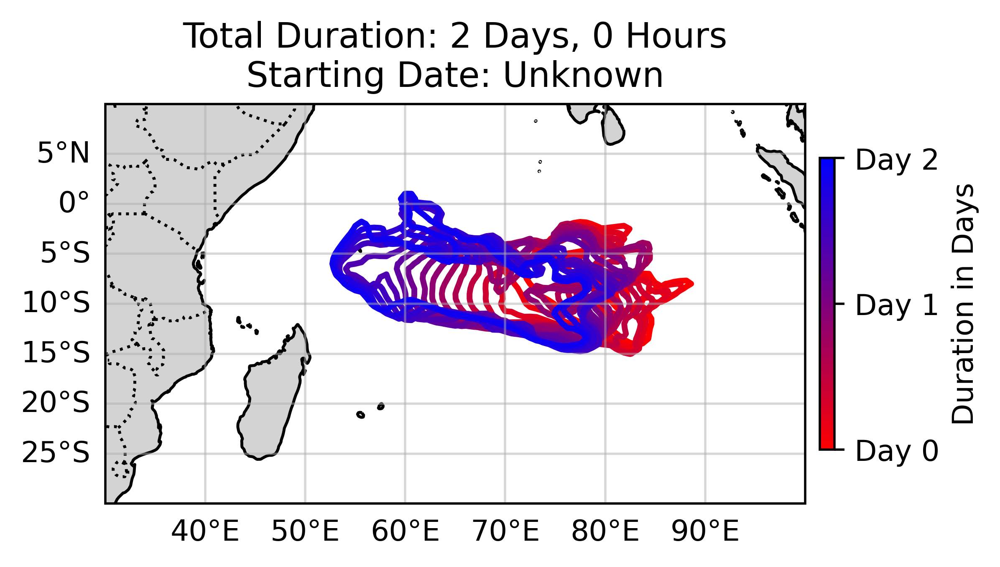

In [123]:
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import numpy as np
from shapely import wkt
from matplotlib.colors import LinearSegmentedColormap

def plot_case_isolines_all_contours(case):
    # Check if case has the correct structure; print error if it's not as expected
    if not isinstance(case, list) or not all(isinstance(row, (dict, pd.Series)) for row in case):
        print("Error: 'case' should be a list of dictionaries or Series containing geometry data.")
        return
    
    # Create a color map from red to blue
    cmap = LinearSegmentedColormap.from_list("red_to_blue", ["red", "blue"])
    
    # Calculate the number of steps and days
    num_steps = len(case)
    duration_hours = num_steps * 3  # Each step represents 3 hours
    duration_days = duration_hours / 24
    
    # Create the plot with a white background
    fig, ax = plt.subplots(figsize=(4.5, 4), dpi=500, subplot_kw={'projection': ccrs.PlateCarree()})
    ax.set_extent([30, 100, -30, 10], crs=ccrs.PlateCarree())  # Adjust the extent to your data
    ax.add_feature(cfeature.LAND, color='lightgray')
    ax.add_feature(cfeature.OCEAN, color='white')
    ax.add_feature(cfeature.COASTLINE)
    ax.add_feature(cfeature.BORDERS, linestyle=':')
    
    # Setup gridlines and label configurations
    gl = ax.gridlines(draw_labels=True, alpha=0.5)
    gl.top_labels = False
    gl.right_labels = False
    gl.bottom_labels = True
    gl.left_labels = True

    for i, row in enumerate(case):
        # Ensure row is in the correct format
        if isinstance(row, str):
            print(f"Skipping row {i} as it is a string.")
            continue
        
        if isinstance(row, pd.Series):
            row = row.to_dict()  # Convert Series to dictionary if necessary
        
        # Check if the geometry is in WKT format and load it
        geom = wkt.loads(row['geometry']) if isinstance(row['geometry'], str) else row['geometry']
        
        # Calculate color based on time progression
        color = cmap(i / num_steps)
        
        # Plot only the boundary of the geometry
        ax.add_geometries([geom], crs=ccrs.PlateCarree(), facecolor='none', edgecolor=color, linewidth=2)

    # Add colorbar related to the duration
    sm = plt.cm.ScalarMappable(cmap=cmap, norm=plt.Normalize(0, duration_days))
    sm.set_array([])
    cbar = plt.colorbar(sm, ax=ax, orientation='vertical', fraction=0.02, pad=0.02)
    cbar.set_label('Duration in Days')
    cbar_ticks = np.arange(0, int(np.ceil(duration_days)) + 1)
    cbar.set_ticks(cbar_ticks)
    cbar.set_ticklabels([f"Day {int(day)}" for day in cbar_ticks])

    # Title showing start date and total duration
    start_date = case[0].get('Date', 'Unknown') if isinstance(case[0], dict) else 'Unknown'
    ax.set_title(f"Total Duration: {int(duration_days)} Days, {duration_hours % 24} Hours\nStarting Date: {start_date}")
    
    plt.show()
print(len(cases))
# Example usage
# Assuming cases[1] is loaded and formatted correctly
plot_case_isolines_all_contours(cases[2]) # well resolved cases consider


In [124]:
cases[2]

[frame                                               2007-06-24 01:30:00_0
 Time                                                                01:30
 Date                                                           2007_06_24
 Month                                                                  06
 DateTime                                              2007-06-24 01:30:00
 geometry                POLYGON ((78.125 -1.8556103515625004, 77.5 -1....
 area                                                        915359.599555
 perimeter                                                     6977.140326
 Effective_Radius                                               539.785152
 Centroidlat                                   0   -8.20963
 dtype: float64
 Centroidlon                                 0    78.594364
 dtype: float64
 Centroid_is_inside                                  0    True
 dtype: bool
 Perimeter_Area_Ratio                                             0.059073
 Maxlon               

In [125]:
def filter_and_merge_datasets(cases, datasets):
    # Extract frame values from the cases
    frames_to_match = [entry['frame'] for entry in cases]
    
    # Filter datasets that have matching frames
    filtered_datasets = [
        ds for ds in datasets if ds.coords['frame'].values in frames_to_match
    ]
    return filtered_datasets
    # Merge the filtered datasets
    #print(filtered_datasets)
    # if filtered_datasets:
    #     merged_dataset = xr.merge(filtered_datasets, join = 'outer')
    #     return merged_dataset
    # else:
    #     raise ValueError("No matching datasets found for the given cases.")

# Example usage
filtered_merged_data = filter_and_merge_datasets(cases[2], all_gdflakes)

# Display the result
#print(filtered_merged_data)


In [126]:
filtered_merged_data[0]

<xarray.Dataset> Size: 27MB
Dimensions:     (lev: 35, lat: 121, lon: 113)
Coordinates:
  * lon         (lon) float64 904B 30.0 30.62 31.25 31.88 ... 98.75 99.38 100.0
  * lat         (lat) float64 968B -30.0 -29.5 -29.0 -28.5 ... 29.0 29.5 30.0
  * lev         (lev) float64 280B 38.0 39.0 40.0 41.0 ... 69.0 70.0 71.0 72.0
    time        datetime64[ns] 8B 2007-06-24T01:30:00
    frame       <U21 84B '2007-06-24 01:30:00_0'
    pressure    (lev) float64 280B 92.37 108.7 127.8 150.4 ... 955.0 970.0 985.0
Data variables: (12/50)
    CLOUD       (lev, lat, lon) float32 2MB ...
    DELP        (lev, lat, lon) float32 2MB ...
    DTDTLWR     (lev, lat, lon) float32 2MB ...
    DTDTLWRCLR  (lev, lat, lon) float32 2MB ...
    DTDTSWR     (lev, lat, lon) float32 2MB ...
    DTDTSWRCLR  (lev, lat, lon) float32 2MB ...
    ...          ...
    EVAP        (lat, lon) float32 55kB ...
    PRECTOT     (lat, lon) float32 55kB ...
    SLP         (lat, lon) float32 55kB ...
    TQV         (lat, lon) float32 55kB ...
    DIST        (lat, lon) float64 109kB 4.606e+06 4.553e+06 ... 3.693e+06
    DIREC       (lat, lon) float64 109kB 254.8 254.4 253.9 ... 30.25 31.06 31.87
Attributes: (12/30)
    History:                           Original file generated: Thu Dec 25 19...
    Comment:                           GMAO filename: d5124_m2_jan00.tavg3_3d...
    Filename:                          MERRA2_300.tavg3_3d_rad_Nv.20070624.nc4
    Conventions:                       CF-1
    Institution:                       NASA Global Modeling and Assimilation ...
    References:                        http://gmao.gsfc.nasa.gov
    ...                                ...
    Contact:                           http://gmao.gsfc.nasa.gov
    identifier_product_doi:            10.5067/7GFQKO1T43RW
    RangeBeginningDate:                2007-06-24
    RangeBeginningTime:                00:00:00.000000
    RangeEndingDate:                   2007-06-24
    RangeEndingTime:                   23:59:59.000000

In [127]:


file_path_local = 'filtered_merged_data_lake.nc'
filtered_merged_data.to_netcdf(file_path_local)
s3_path = 'openscapeshub-scratch/test/'+ 'filtered_merged_data_lake.nc'

fs_out.put(file_path_local, f's3://{s3_path}')


AttributeError: 'list' object has no attribute 'to_netcdf'

In [55]:
ds = xr.open_dataset('filtered_merged_data_lake.nc')

In [56]:
ds

<xarray.Dataset> Size: 432MB
Dimensions:     (time: 16, lev: 35, lat: 121, lon: 113)
Coordinates:
  * lon         (lon) float64 904B 30.0 30.62 31.25 31.88 ... 98.75 99.38 100.0
  * lat         (lat) float64 968B -30.0 -29.5 -29.0 -28.5 ... 29.0 29.5 30.0
  * lev         (lev) float64 280B 38.0 39.0 40.0 41.0 ... 69.0 70.0 71.0 72.0
  * time        (time) datetime64[ns] 128B 2007-06-24T01:30:00 ... 2007-06-25...
    frame       (time) <U21 1kB ...
    pressure    (lev) float64 280B ...
Data variables: (12/50)
    CLOUD       (time, lev, lat, lon) float32 31MB ...
    DELP        (time, lev, lat, lon) float32 31MB ...
    DTDTLWR     (time, lev, lat, lon) float32 31MB ...
    DTDTLWRCLR  (time, lev, lat, lon) float32 31MB ...
    DTDTSWR     (time, lev, lat, lon) float32 31MB ...
    DTDTSWRCLR  (time, lev, lat, lon) float32 31MB ...
    ...          ...
    EVAP        (time, lat, lon) float32 875kB ...
    PRECTOT     (time, lat, lon) float32 875kB ...
    SLP         (time, lat, lon) float32 875kB ...
    TQV         (time, lat, lon) float32 875kB ...
    DIST        (time, lat, lon) float64 2MB ...
    DIREC       (time, lat, lon) float64 2MB ...
Attributes: (12/30)
    History:                           Original file generated: Thu Dec 25 19...
    Comment:                           GMAO filename: d5124_m2_jan00.tavg3_3d...
    Filename:                          MERRA2_300.tavg3_3d_rad_Nv.20070624.nc4
    Conventions:                       CF-1
    Institution:                       NASA Global Modeling and Assimilation ...
    References:                        http://gmao.gsfc.nasa.gov
    ...                                ...
    Contact:                           http://gmao.gsfc.nasa.gov
    identifier_product_doi:            10.5067/7GFQKO1T43RW
    RangeBeginningDate:                2007-06-24
    RangeBeginningTime:                00:00:00.000000
    RangeEndingDate:                   2007-06-24
    RangeEndingTime:                   23:59:59.000000

In [135]:
ds =xr.concat(filtered_merged_data,dim='time')

In [137]:


file_path_local = 'filtered_merged_data_lake.nc'
ds.to_netcdf(file_path_local)
s3_path = 'openscapeshub-scratch/test/'+ 'filtered_merged_data_lake.nc'

fs_out.put(file_path_local, f's3://{s3_path}')


[None]

In [33]:
# List of variables to process
var_diag = ['DQVDT_PHY', 'DQVDT_MST', 'DQVDT_TRB', 'DQVDT_DYN', 'DQVDT_ANA', 'UFLXQV', 'VFLXQV', 'SWNETTOA', 'LWTNET']
var_flux = ['EVAP', 'PRECTOT']
var_slv = ['SLP', 'TQV','DIST','DIREC']

# Combine all variables into a single list
selected_vars = var_diag + var_flux + var_slv

In [57]:
selected_data = ds[selected_vars]

In [58]:
data = selected_data.sel(time=selected_data.time[::3])

In [59]:
time_diff = data.diff(dim='time')

In [38]:
time_diff

<xarray.Dataset> Size: 5MB
Dimensions:    (time: 5, lat: 121, lon: 113)
Coordinates:
  * lon        (lon) float64 904B 30.0 30.62 31.25 31.88 ... 98.75 99.38 100.0
  * lat        (lat) float64 968B -30.0 -29.5 -29.0 -28.5 ... 29.0 29.5 30.0
  * time       (time) datetime64[ns] 40B 2007-06-24T10:30:00 ... 2007-06-25T2...
    frame      (time) <U21 420B ...
Data variables: (12/15)
    DQVDT_PHY  (time, lat, lon) float32 273kB 7.936e-05 5.152e-05 ... -1.162e-06
    DQVDT_MST  (time, lat, lon) float32 273kB 0.0 0.0 ... -5.807e-08 -1.935e-07
    DQVDT_TRB  (time, lat, lon) float32 273kB 7.936e-05 5.152e-05 ... -9.734e-07
    DQVDT_DYN  (time, lat, lon) float32 273kB -2.298e-06 ... 5.263e-05
    DQVDT_ANA  (time, lat, lon) float32 273kB 5.478e-06 2.742e-05 ... -1.693e-05
    UFLXQV     (time, lat, lon) float32 273kB -9.623 -15.71 ... 12.95 9.687
    ...         ...
    EVAP       (time, lat, lon) float32 273kB 8.255e-05 6.658e-05 ... -9.985e-07
    PRECTOT    (time, lat, lon) float32 273kB 0.0 0.0 ... -1.779e-10 -1.297e-07
    SLP        (time, lat, lon) float32 273kB 171.8 142.8 ... -19.27 -138.8
    TQV        (time, lat, lon) float32 273kB 1.581 1.917 ... 0.1842 -0.3939
    DIST       (time, lat, lon) float64 547kB -4.558e+05 -4.56e+05 ... 1.579e+05
    DIREC      (time, lat, lon) float64 547kB -0.9512 -0.9689 ... 2.495 2.467
Attributes: (12/30)
    History:                           Original file generated: Thu Dec 25 19...
    Comment:                           GMAO filename: d5124_m2_jan00.tavg3_3d...
    Filename:                          MERRA2_300.tavg3_3d_rad_Nv.20070624.nc4
    Conventions:                       CF-1
    Institution:                       NASA Global Modeling and Assimilation ...
    References:                        http://gmao.gsfc.nasa.gov
    ...                                ...
    Contact:                           http://gmao.gsfc.nasa.gov
    identifier_product_doi:            10.5067/7GFQKO1T43RW
    RangeBeginningDate:                2007-06-24
    RangeBeginningTime:                00:00:00.000000
    RangeEndingDate:                   2007-06-24
    RangeEndingTime:                   23:59:59.000000

In [39]:
data

<xarray.Dataset> Size: 6MB
Dimensions:    (time: 6, lat: 121, lon: 113)
Coordinates:
  * lon        (lon) float64 904B 30.0 30.62 31.25 31.88 ... 98.75 99.38 100.0
  * lat        (lat) float64 968B -30.0 -29.5 -29.0 -28.5 ... 29.0 29.5 30.0
  * time       (time) datetime64[ns] 48B 2007-06-24T01:30:00 ... 2007-06-25T2...
    frame      (time) <U21 504B ...
Data variables: (12/15)
    DQVDT_PHY  (time, lat, lon) float32 328kB ...
    DQVDT_MST  (time, lat, lon) float32 328kB ...
    DQVDT_TRB  (time, lat, lon) float32 328kB ...
    DQVDT_DYN  (time, lat, lon) float32 328kB ...
    DQVDT_ANA  (time, lat, lon) float32 328kB ...
    UFLXQV     (time, lat, lon) float32 328kB ...
    ...         ...
    EVAP       (time, lat, lon) float32 328kB ...
    PRECTOT    (time, lat, lon) float32 328kB ...
    SLP        (time, lat, lon) float32 328kB ...
    TQV        (time, lat, lon) float32 328kB ...
    DIST       (time, lat, lon) float64 656kB ...
    DIREC      (time, lat, lon) float64 656kB ...
Attributes: (12/30)
    History:                           Original file generated: Thu Dec 25 19...
    Comment:                           GMAO filename: d5124_m2_jan00.tavg3_3d...
    Filename:                          MERRA2_300.tavg3_3d_rad_Nv.20070624.nc4
    Conventions:                       CF-1
    Institution:                       NASA Global Modeling and Assimilation ...
    References:                        http://gmao.gsfc.nasa.gov
    ...                                ...
    Contact:                           http://gmao.gsfc.nasa.gov
    identifier_product_doi:            10.5067/7GFQKO1T43RW
    RangeBeginningDate:                2007-06-24
    RangeBeginningTime:                00:00:00.000000
    RangeEndingDate:                   2007-06-24
    RangeEndingTime:                   23:59:59.000000

IndexError: index 5 is out of bounds for axis 0 with size 5

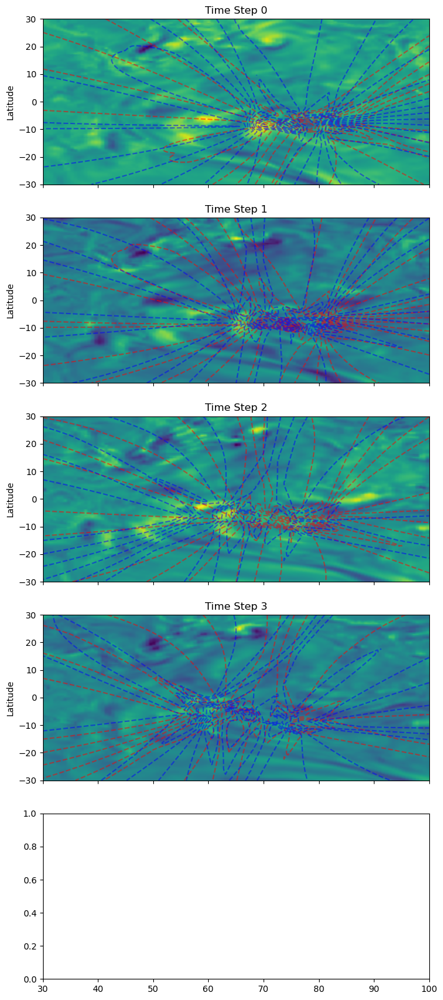

In [40]:


# Example dimensions and coordinates for demonstration purposes
time = time_diff.time  # Placeholder for actual time steps in `time_diff`
lat = time_diff.lat
lon = time_diff.lon

# Example data for TQV and DIST from `time_diff` dataset (simulated for plotting)
TQV = time_diff.TQV # Placeholder for TQV values
DIST = time_diff.DIST  # Placeholder for DIST values

# Initialize subplots
fig, axes = plt.subplots(5, 1, figsize=(8, 20), sharex=True)

for i, ax in enumerate(axes):
    # Select the TQV data for the current time step
    tqv_data = TQV[i]
    
    # Overlay DIST from data at i and i+1
    dist_data_start = DIST[i]
    dist_data_end = DIST[i + 1]
    
    # Plot TQV for the current time step
    c = ax.imshow(tqv_data, extent=[lon.min(), lon.max(), lat.min(), lat.max()],
                  aspect='auto', cmap='viridis', origin='lower')
    
    # Overlay DIST as transparent lines
    ax.contour(lon, lat, dist_data_start, levels=10, colors='red', alpha=0.5, linestyles='--')
    ax.contour(lon, lat, dist_data_end, levels=10, colors='blue', alpha=0.5, linestyles='--')
    
    # Labeling each subplot
    ax.set_title(f'Time Step {i}')
    ax.set_ylabel('Latitude')

# Add a colorbar to the last subplot for TQV
fig.colorbar(c, ax=axes, orientation='vertical', label='TQV')

# Label the x-axis on the last subplot
axes[-1].set_xlabel('Longitude')

# Adjust layout for readability
plt.tight_layout()
plt.show()


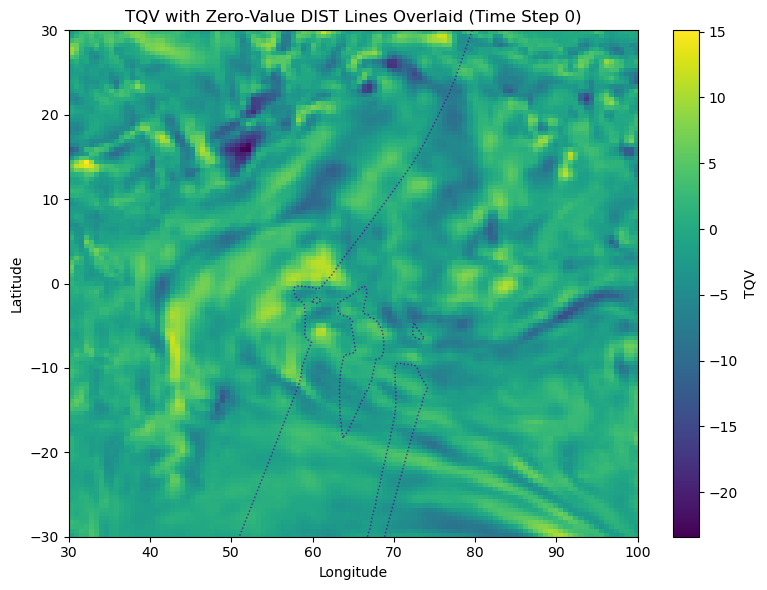

In [45]:
# Re-plot focusing on zero-value DIST lines
# Example dimensions and coordinates for demonstration purposes
time = time_diff.time  # Placeholder for actual time steps in `time_diff`
lat = time_diff.lat
lon = time_diff.lon

# Example data for TQV and DIST from `time_diff` dataset (simulated for plotting)
TQV = time_diff.TQV # Placeholder for TQV values
DIST = data.DIST  # Placeholder for DIST values

fig, ax = plt.subplots(figsize=(8, 6))

# Plot TQV for the selected time step
c = ax.imshow(tqv_data, extent=[lon.min(), lon.max(), lat.min(), lat.max()],
              aspect='auto', cmap='viridis', origin='lower')

# Overlay zero-value DIST lines as transparent dotted lines
ax.contour(lon, lat, dist_data_start, levels=[0], colors='red', alpha=0.5, linestyles=':', linewidths=1)
ax.contour(lon, lat, dist_data_end, levels=[0], colors='blue', alpha=0.5, linestyles=':', linewidths=1)

# Add title and labels
ax.set_title('TQV with Zero-Value DIST Lines Overlaid (Time Step 0)')
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')

# Add a colorbar for TQV
fig.colorbar(c, ax=ax, label='TQV')

plt.tight_layout()
plt.show()


In [54]:
data

<xarray.Dataset> Size: 6MB
Dimensions:    (time: 6, lat: 121, lon: 113)
Coordinates:
  * lon        (lon) float64 904B 30.0 30.62 31.25 31.88 ... 98.75 99.38 100.0
  * lat        (lat) float64 968B -30.0 -29.5 -29.0 -28.5 ... 29.0 29.5 30.0
  * time       (time) datetime64[ns] 48B 2007-06-24T01:30:00 ... 2007-06-25T2...
    frame      (time) <U21 504B ...
Data variables: (12/15)
    DQVDT_PHY  (time, lat, lon) float32 328kB ...
    DQVDT_MST  (time, lat, lon) float32 328kB ...
    DQVDT_TRB  (time, lat, lon) float32 328kB ...
    DQVDT_DYN  (time, lat, lon) float32 328kB ...
    DQVDT_ANA  (time, lat, lon) float32 328kB ...
    UFLXQV     (time, lat, lon) float32 328kB ...
    ...         ...
    EVAP       (time, lat, lon) float32 328kB ...
    PRECTOT    (time, lat, lon) float32 328kB ...
    SLP        (time, lat, lon) float32 328kB ...
    TQV        (time, lat, lon) float32 328kB ...
    DIST       (time, lat, lon) float64 656kB ...
    DIREC      (time, lat, lon) float64 656kB ...
Attributes: (12/30)
    History:                           Original file generated: Thu Dec 25 19...
    Comment:                           GMAO filename: d5124_m2_jan00.tavg3_3d...
    Filename:                          MERRA2_300.tavg3_3d_rad_Nv.20070624.nc4
    Conventions:                       CF-1
    Institution:                       NASA Global Modeling and Assimilation ...
    References:                        http://gmao.gsfc.nasa.gov
    ...                                ...
    Contact:                           http://gmao.gsfc.nasa.gov
    identifier_product_doi:            10.5067/7GFQKO1T43RW
    RangeBeginningDate:                2007-06-24
    RangeBeginningTime:                00:00:00.000000
    RangeEndingDate:                   2007-06-24
    RangeEndingTime:                   23:59:59.000000

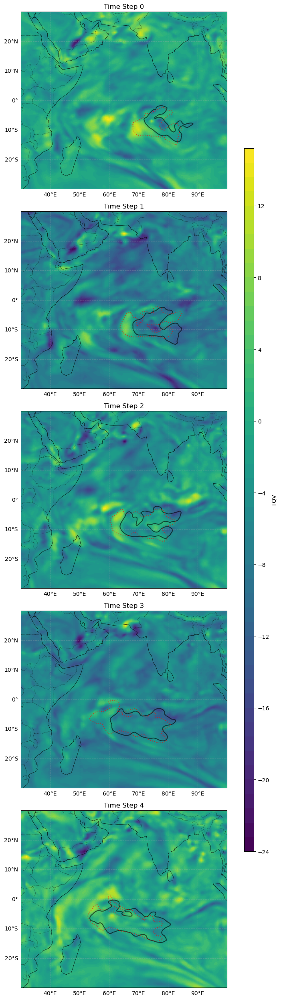

In [96]:
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import numpy as np
import matplotlib.pyplot as plt
time = time_diff.time  # Placeholder for actual time steps in `time_diff`
lat = time_diff.lat
lon = time_diff.lon

# Example data for TQV and DIST from `time_diff` dataset (simulated for plotting)
TQV = time_diff.TQV # Placeholder for TQV values
DIST = data.DIST  # Placeholder for DIST values

# Generate the required plot with `contourf` for TQV and overlay DIST zero-value lines
fig, axes = plt.subplots(5, 1, figsize=(12, 25), subplot_kw={'projection': ccrs.PlateCarree()})

for i, ax in enumerate(axes):
    # Add map features and transparent gridlines
    ax.add_feature(cfeature.COASTLINE, linewidth=0.5)
    ax.add_feature(cfeature.BORDERS, linewidth=0.5, linestyle=':')
    gl = ax.gridlines(draw_labels=True, alpha=0.3, linestyle='--')
    gl.top_labels = gl.right_labels = False  # Disable top and right labels
    
    # Plot TQV for the current time step using contourf
    tqv_data = TQV[i]
    c = ax.contourf(lon, lat, tqv_data, levels=50, cmap='viridis', transform=ccrs.PlateCarree())
    
    # Overlay the zero-value DIST lines for the current time step and next
    dist_zero_start = np.where(np.isclose(DIST[i], 0.5), 1, np.nan)
    dist_zero_end = np.where(np.isclose(DIST[i + 1], 0.5), 1, np.nan)
    
    ax.contour(lon, lat, DIST[i], levels=[1], colors='black', alpha=0.6, linestyles='-', transform=ccrs.PlateCarree(),label ='current')
    ax.contour(lon, lat, DIST[i+1], levels=[1], colors='red', alpha=0.6, linestyles=':', transform=ccrs.PlateCarree(),label='next')

    # Label each subplot with the time step and date
    ax.set_title(f'Time Step {i}', fontsize=12)
    ax.set_ylabel('Latitude', fontsize=10)

# Add a colorbar to the right of all subplots
cbar_ax = fig.add_axes([0.75, 0.15, 0.02, 0.7])  # [left, bottom, width, height]
fig.colorbar(c, cax=cbar_ax, label='TQV')

# Add a common x-axis label
axes[-1].set_xlabel('Longitude', fontsize=10)

# Add a suptitle for the datetime information
#fig.suptitle('TQV and DIST Zero-Value Lines for Different Time Steps', fontsize=16, y=0.93)

# Adjust layout for better readability
plt.tight_layout()  # Adjust to make room for colorbar
plt.show()


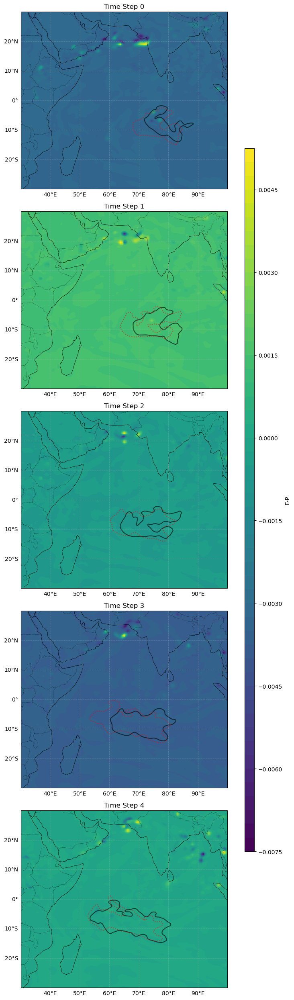

In [97]:
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import numpy as np
import matplotlib.pyplot as plt
time = time_diff.time  # Placeholder for actual time steps in `time_diff`
lat = time_diff.lat
lon = time_diff.lon

# Example data for TQV and DIST from `time_diff` dataset (simulated for plotting)
TQV = time_diff.EVAP - time_diff.PRECTOT # Placeholder for TQV values
DIST = data.DIST  # Placeholder for DIST values

# Generate the required plot with `contourf` for TQV and overlay DIST zero-value lines
fig, axes = plt.subplots(5, 1, figsize=(12, 25), subplot_kw={'projection': ccrs.PlateCarree()})

for i, ax in enumerate(axes):
    # Add map features and transparent gridlines
    ax.add_feature(cfeature.COASTLINE, linewidth=0.5)
    ax.add_feature(cfeature.BORDERS, linewidth=0.5, linestyle=':')
    gl = ax.gridlines(draw_labels=True, alpha=0.3, linestyle='--')
    gl.top_labels = gl.right_labels = False  # Disable top and right labels
    
    # Plot TQV for the current time step using contourf
    tqv_data = TQV[i]
    c = ax.contourf(lon, lat, tqv_data, levels=50, cmap='viridis', transform=ccrs.PlateCarree())
    
    # Overlay the zero-value DIST lines for the current time step and next
    dist_zero_start = np.where(np.isclose(DIST[i], 0.5), 1, np.nan)
    dist_zero_end = np.where(np.isclose(DIST[i + 1], 0.5), 1, np.nan)
    
    ax.contour(lon, lat, DIST[i], levels=[1], colors='black', alpha=0.6, linestyles='-', transform=ccrs.PlateCarree(),label ='current')
    ax.contour(lon, lat, DIST[i+1], levels=[1], colors='red', alpha=0.6, linestyles=':', transform=ccrs.PlateCarree(),label='next')

    # Label each subplot with the time step and date
    ax.set_title(f'Time Step {i}', fontsize=12)
    ax.set_ylabel('Latitude', fontsize=10)

# Add a colorbar to the right of all subplots
cbar_ax = fig.add_axes([0.75, 0.15, 0.02, 0.7])  # [left, bottom, width, height]
fig.colorbar(c, cax=cbar_ax, label='E-P')

# Add a common x-axis label
axes[-1].set_xlabel('Longitude', fontsize=10)

# Add a suptitle for the datetime information
#fig.suptitle('TQV and DIST Zero-Value Lines for Different Time Steps', fontsize=16, y=0.93)

# Adjust layout for better readability
plt.tight_layout()  # Adjust to make room for colorbar
plt.show()


In [98]:
time_diff

<xarray.Dataset> Size: 5MB
Dimensions:    (time: 5, lat: 121, lon: 113)
Coordinates:
  * lon        (lon) float64 904B 30.0 30.62 31.25 31.88 ... 98.75 99.38 100.0
  * lat        (lat) float64 968B -30.0 -29.5 -29.0 -28.5 ... 29.0 29.5 30.0
  * time       (time) datetime64[ns] 40B 2007-06-24T10:30:00 ... 2007-06-25T2...
    frame      (time) <U21 420B ...
Data variables: (12/15)
    DQVDT_PHY  (time, lat, lon) float32 273kB 7.936e-05 5.152e-05 ... -1.162e-06
    DQVDT_MST  (time, lat, lon) float32 273kB 0.0 0.0 ... -5.807e-08 -1.935e-07
    DQVDT_TRB  (time, lat, lon) float32 273kB 7.936e-05 5.152e-05 ... -9.734e-07
    DQVDT_DYN  (time, lat, lon) float32 273kB -2.298e-06 ... 5.263e-05
    DQVDT_ANA  (time, lat, lon) float32 273kB 5.478e-06 2.742e-05 ... -1.693e-05
    UFLXQV     (time, lat, lon) float32 273kB -9.623 -15.71 ... 12.95 9.687
    ...         ...
    EVAP       (time, lat, lon) float32 273kB 8.255e-05 6.658e-05 ... -9.985e-07
    PRECTOT    (time, lat, lon) float32 273kB 0.0 0.0 ... -1.779e-10 -1.297e-07
    SLP        (time, lat, lon) float32 273kB 171.8 142.8 ... -19.27 -138.8
    TQV        (time, lat, lon) float32 273kB 1.581 1.917 ... 0.1842 -0.3939
    DIST       (time, lat, lon) float64 547kB -4.558e+05 -4.56e+05 ... 1.579e+05
    DIREC      (time, lat, lon) float64 547kB -0.9512 -0.9689 ... 2.495 2.467
Attributes: (12/30)
    History:                           Original file generated: Thu Dec 25 19...
    Comment:                           GMAO filename: d5124_m2_jan00.tavg3_3d...
    Filename:                          MERRA2_300.tavg3_3d_rad_Nv.20070624.nc4
    Conventions:                       CF-1
    Institution:                       NASA Global Modeling and Assimilation ...
    References:                        http://gmao.gsfc.nasa.gov
    ...                                ...
    Contact:                           http://gmao.gsfc.nasa.gov
    identifier_product_doi:            10.5067/7GFQKO1T43RW
    RangeBeginningDate:                2007-06-24
    RangeBeginningTime:                00:00:00.000000
    RangeEndingDate:                   2007-06-24
    RangeEndingTime:                   23:59:59.000000

In [121]:
dVFLXQV_dy = np.gradient(data.VFLXQV, axis=1) / dy  # Meridional derivative (lat)
dUFLXQV_dx = np.gradient(data.UFLXQV, axis=2) / dx  # Zonal derivative (lon)


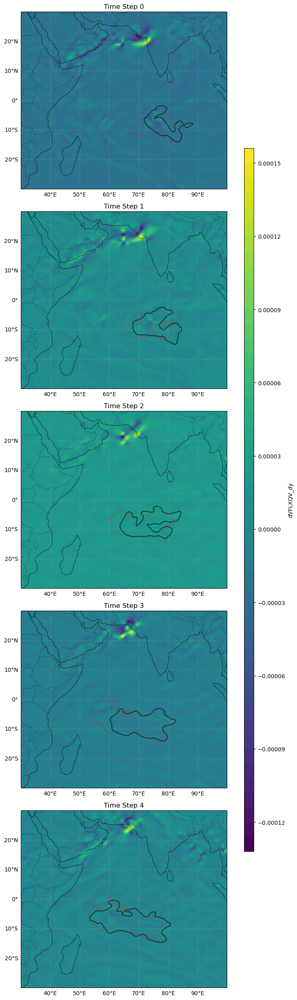

In [110]:
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import numpy as np
import matplotlib.pyplot as plt
time = time_diff.time  # Placeholder for actual time steps in `time_diff`
lat = time_diff.lat
lon = time_diff.lon

# Example data for TQV and DIST from `time_diff` dataset (simulated for plotting)
TQV = dVFLXQV_dy # Placeholder for TQV values
DIST = data.DIST  # Placeholder for DIST values

# Generate the required plot with `contourf` for TQV and overlay DIST zero-value lines
fig, axes = plt.subplots(5, 1, figsize=(12, 25), subplot_kw={'projection': ccrs.PlateCarree()})

for i, ax in enumerate(axes):
    # Add map features and transparent gridlines
    ax.add_feature(cfeature.COASTLINE, linewidth=0.5)
    ax.add_feature(cfeature.BORDERS, linewidth=0.5, linestyle=':')
    gl = ax.gridlines(draw_labels=True, alpha=0.3, linestyle='--')
    gl.top_labels = gl.right_labels = False  # Disable top and right labels
    
    # Plot TQV for the current time step using contourf
    tqv_data = TQV[i]
    c = ax.contourf(lon, lat, tqv_data, levels=50, cmap='viridis', transform=ccrs.PlateCarree())
    
    # Overlay the zero-value DIST lines for the current time step and next
    dist_zero_start = np.where(np.isclose(DIST[i], 0.5), 1, np.nan)
    dist_zero_end = np.where(np.isclose(DIST[i + 1], 0.5), 1, np.nan)
    
    ax.contour(lon, lat, DIST[i], levels=[1], colors='black', alpha=0.6, linestyles='-', transform=ccrs.PlateCarree(),label ='current')
    ax.contour(lon, lat, DIST[i+1], levels=[1], colors='red', alpha=0.6, linestyles=':', transform=ccrs.PlateCarree(),label='next')

    # Label each subplot with the time step and date
    ax.set_title(f'Time Step {i}', fontsize=12)
    ax.set_ylabel('Latitude', fontsize=10)

# Add a colorbar to the right of all subplots
cbar_ax = fig.add_axes([0.75, 0.15, 0.02, 0.7])  # [left, bottom, width, height]
fig.colorbar(c, cax=cbar_ax, label='dVFLXQV_dy')

# Add a common x-axis label
axes[-1].set_xlabel('Longitude', fontsize=10)

# Add a suptitle for the datetime information
#fig.suptitle('TQV and DIST Zero-Value Lines for Different Time Steps', fontsize=16, y=0.93)

# Adjust layout for better readability
plt.tight_layout()  # Adjust to make room for colorbar
plt.show()


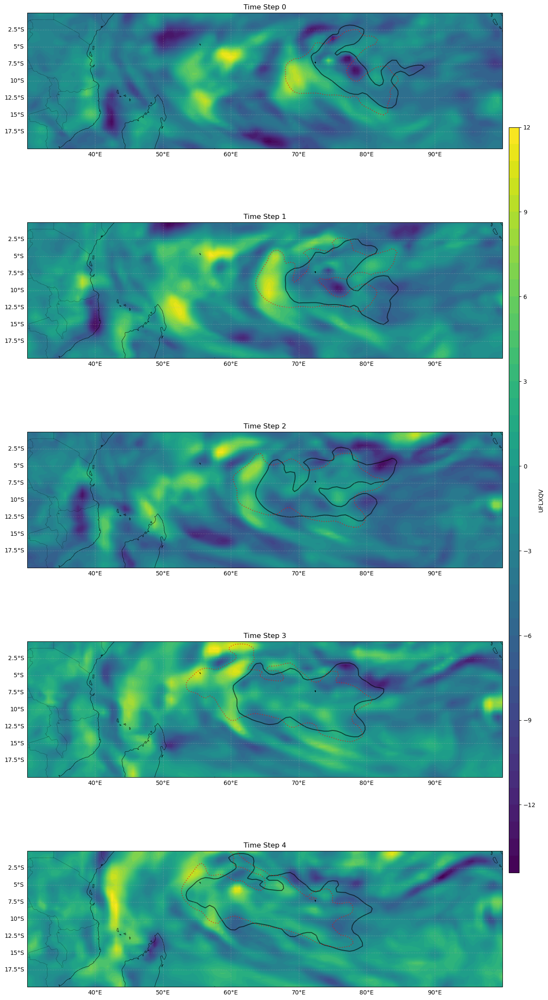

In [118]:
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import numpy as np
import matplotlib.pyplot as plt
time = time_diff.time  # Placeholder for actual time steps in `time_diff`
lat = time_diff.lat[lat_indices]
lon = time_diff.lon

# Example data for TQV and DIST from `time_diff` dataset (simulated for plotting)
TQV = time_diff.TQV[:,lat_indices,:] # Placeholder for TQV values

DIST = data.DIST[:,lat_indices,:]  # Placeholder for DIST values

# Generate the required plot with `contourf` for TQV and overlay DIST zero-value lines
fig, axes = plt.subplots(5, 1, figsize=(12, 25), subplot_kw={'projection': ccrs.PlateCarree()})

for i, ax in enumerate(axes):
    # Add map features and transparent gridlines
    ax.add_feature(cfeature.COASTLINE, linewidth=0.5)
    ax.add_feature(cfeature.BORDERS, linewidth=0.5, linestyle=':')
    gl = ax.gridlines(draw_labels=True, alpha=0.3, linestyle='--')
    gl.top_labels = gl.right_labels = False  # Disable top and right labels
    
    # Plot TQV for the current time step using contourf
    tqv_data = TQV[i]
    c = ax.contourf(lon, lat, tqv_data, levels=50, cmap='viridis', transform=ccrs.PlateCarree())
    
    # Overlay the zero-value DIST lines for the current time step and next
    dist_zero_start = np.where(np.isclose(DIST[i], 0.5), 1, np.nan)
    dist_zero_end = np.where(np.isclose(DIST[i + 1], 0.5), 1, np.nan)
    
    ax.contour(lon, lat, DIST[i], levels=[1], colors='black', alpha=0.6, linestyles='-', transform=ccrs.PlateCarree(),label ='current')
    ax.contour(lon, lat, DIST[i+1], levels=[1], colors='red', alpha=0.6, linestyles=':', transform=ccrs.PlateCarree(),label='next')

    # Label each subplot with the time step and date
    ax.set_title(f'Time Step {i}', fontsize=12)
    ax.set_ylabel('Latitude', fontsize=10)

# Add a colorbar to the right of all subplots
cbar_ax = fig.add_axes([1.0, 0.15, 0.02, 0.7])  # [left, bottom, width, height]
fig.colorbar(c, cax=cbar_ax, label='UFLXQV')

# Add a common x-axis label
axes[-1].set_xlabel('Longitude', fontsize=10)

# Add a suptitle for the datetime information
#fig.suptitle('TQV and DIST Zero-Value Lines for Different Time Steps', fontsize=16, y=0.93)

# Adjust layout for better readability
plt.tight_layout()  # Adjust to make room for colorbar
plt.show()


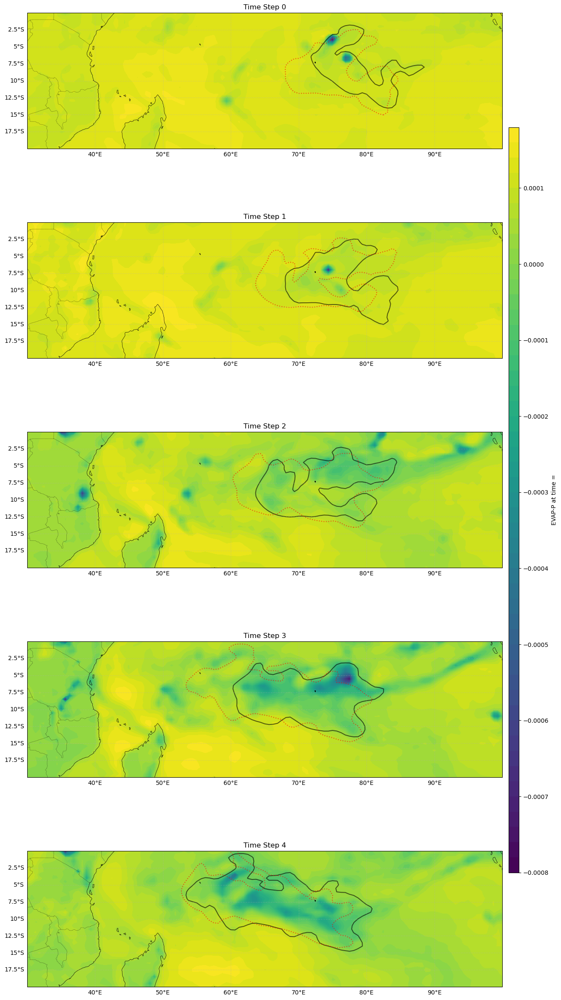

In [120]:
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import numpy as np
import matplotlib.pyplot as plt
time = data.time  # Placeholder for actual time steps in `time_diff`
lat = data.lat[lat_indices]
lon = data.lon

# Example data for TQV and DIST from `time_diff` dataset (simulated for plotting)
TQV = (data.EVAP-data.PRECTOT)[:,lat_indices,:] # Placeholder for TQV values

DIST = data.DIST[:,lat_indices,:]  # Placeholder for DIST values

# Generate the required plot with `contourf` for TQV and overlay DIST zero-value lines
fig, axes = plt.subplots(5, 1, figsize=(12, 25), subplot_kw={'projection': ccrs.PlateCarree()})

for i, ax in enumerate(axes):
    # Add map features and transparent gridlines
    ax.add_feature(cfeature.COASTLINE, linewidth=0.5)
    ax.add_feature(cfeature.BORDERS, linewidth=0.5, linestyle=':')
    gl = ax.gridlines(draw_labels=True, alpha=0.3, linestyle='--')
    gl.top_labels = gl.right_labels = False  # Disable top and right labels
    
    # Plot TQV for the current time step using contourf
    tqv_data = TQV[i]
    c = ax.contourf(lon, lat, tqv_data, levels=50, cmap='viridis', transform=ccrs.PlateCarree())
    
    # Overlay the zero-value DIST lines for the current time step and next
    dist_zero_start = np.where(np.isclose(DIST[i], 0.5), 1, np.nan)
    dist_zero_end = np.where(np.isclose(DIST[i + 1], 0.5), 1, np.nan)
    
    ax.contour(lon, lat, DIST[i], levels=[1], colors='black', alpha=0.6, linestyles='-', transform=ccrs.PlateCarree(),label ='current')
    ax.contour(lon, lat, DIST[i+1], levels=[1], colors='red', alpha=0.6, linestyles=':', transform=ccrs.PlateCarree(),label='next')

    # Label each subplot with the time step and date
    ax.set_title(f'Time Step {i}', fontsize=12)
    ax.set_ylabel('Latitude', fontsize=10)

# Add a colorbar to the right of all subplots
cbar_ax = fig.add_axes([1.0, 0.15, 0.02, 0.7])  # [left, bottom, width, height]
fig.colorbar(c, cax=cbar_ax, label='EVAP-P at time =')

# Add a common x-axis label
axes[-1].set_xlabel('Longitude', fontsize=10)

# Add a suptitle for the datetime information
#fig.suptitle('TQV and DIST Zero-Value Lines for Different Time Steps', fontsize=16, y=0.93)

# Adjust layout for better readability
plt.tight_layout()  # Adjust to make room for colorbar
plt.show()


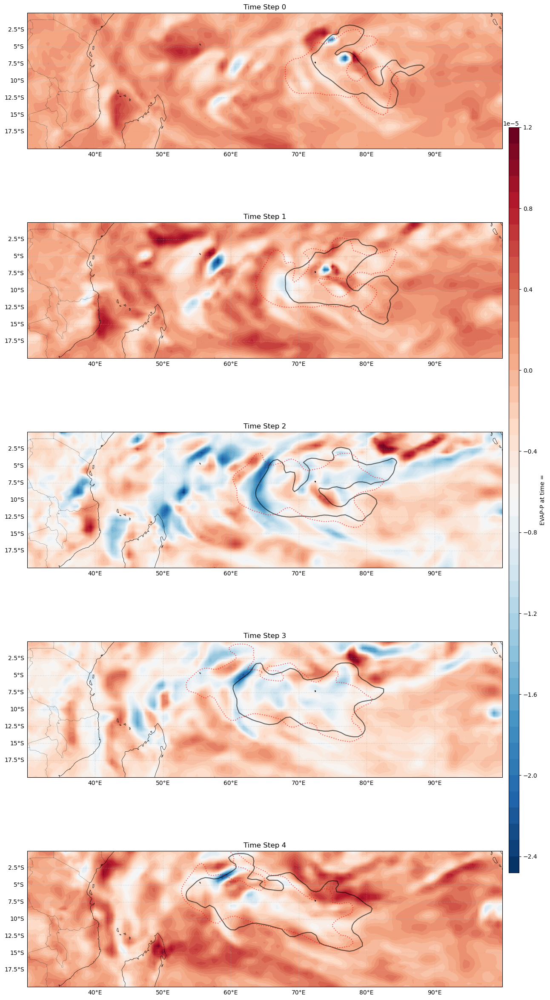

In [126]:
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import numpy as np
import matplotlib.pyplot as plt
time = data.time  # Placeholder for actual time steps in `time_diff`
lat = data.lat[lat_indices]
lon = data.lon

# Example data for TQV and DIST from `time_diff` dataset (simulated for plotting)
TQV = dVFLXQV_dy[:,lat_indices,:] + dUFLXQV_dx[:,lat_indices,:]# Placeholder for TQV values

DIST = data.DIST[:,lat_indices,:]  # Placeholder for DIST values

# Generate the required plot with `contourf` for TQV and overlay DIST zero-value lines
fig, axes = plt.subplots(5, 1, figsize=(12, 25), subplot_kw={'projection': ccrs.PlateCarree()})

for i, ax in enumerate(axes):
    # Add map features and transparent gridlines
    ax.add_feature(cfeature.COASTLINE, linewidth=0.5)
    ax.add_feature(cfeature.BORDERS, linewidth=0.5, linestyle=':')
    gl = ax.gridlines(draw_labels=True, alpha=0.3, linestyle='--')
    gl.top_labels = gl.right_labels = False  # Disable top and right labels
    
    # Plot TQV for the current time step using contourf
    tqv_data = TQV[i]
    c = ax.contourf(lon, lat, tqv_data, levels=50, cmap='RdBu_r', transform=ccrs.PlateCarree())
    
    # Overlay the zero-value DIST lines for the current time step and next
    dist_zero_start = np.where(np.isclose(DIST[i], 0.5), 1, np.nan)
    dist_zero_end = np.where(np.isclose(DIST[i + 1], 0.5), 1, np.nan)
    
    ax.contour(lon, lat, DIST[i], levels=[1], colors='black', alpha=0.6, linestyles='-', transform=ccrs.PlateCarree(),label ='current')
    ax.contour(lon, lat, DIST[i+1], levels=[1], colors='red', alpha=0.6, linestyles=':', transform=ccrs.PlateCarree(),label='next')

    # Label each subplot with the time step and date
    ax.set_title(f'Time Step {i}', fontsize=12)
    ax.set_ylabel('Latitude', fontsize=10)

# Add a colorbar to the right of all subplots
cbar_ax = fig.add_axes([1.0, 0.15, 0.02, 0.7])  # [left, bottom, width, height]
fig.colorbar(c, cax=cbar_ax, label='EVAP-P at time =')

# Add a common x-axis label
axes[-1].set_xlabel('Longitude', fontsize=10)

# Add a suptitle for the datetime information
#fig.suptitle('TQV and DIST Zero-Value Lines for Different Time Steps', fontsize=16, y=0.93)

# Adjust layout for better readability
plt.tight_layout()  # Adjust to make room for colorbar
plt.show()


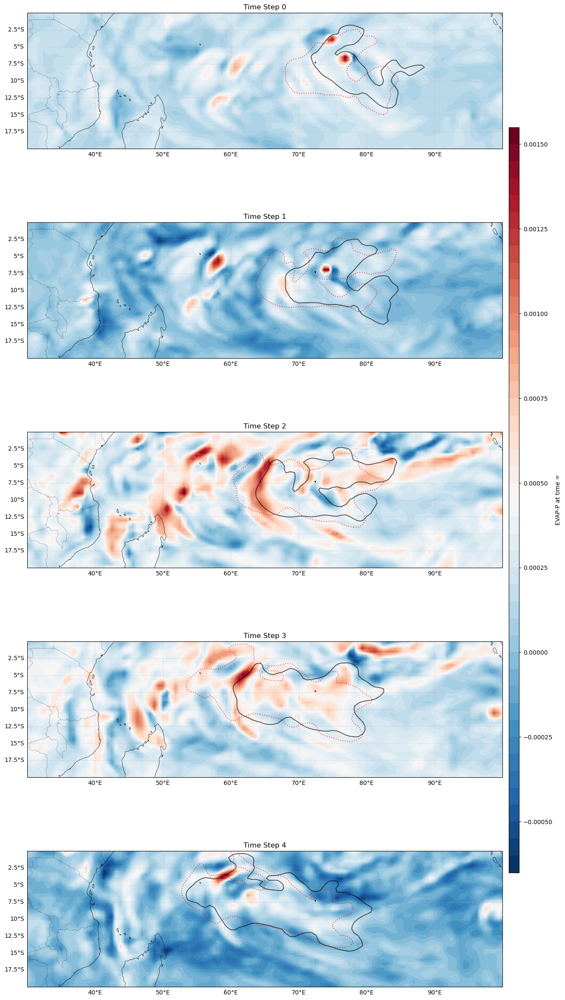

In [130]:
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import numpy as np
import matplotlib.pyplot as plt
time = data.time  # Placeholder for actual time steps in `time_diff`
lat = data.lat[lat_indices]
lon = data.lon

# Example data for TQV and DIST from `time_diff` dataset (simulated for plotting)
TQV = data.DQVDT_DYN[:,lat_indices,:] - (dVFLXQV_dy[:,lat_indices,:] + dUFLXQV_dx[:,lat_indices,:]) # Placeholder for TQV values

DIST = data.DIST[:,lat_indices,:]  # Placeholder for DIST values

# Generate the required plot with `contourf` for TQV and overlay DIST zero-value lines
fig, axes = plt.subplots(5, 1, figsize=(12, 25), subplot_kw={'projection': ccrs.PlateCarree()})

for i, ax in enumerate(axes):
    # Add map features and transparent gridlines
    ax.add_feature(cfeature.COASTLINE, linewidth=0.5)
    ax.add_feature(cfeature.BORDERS, linewidth=0.5, linestyle=':')
    gl = ax.gridlines(draw_labels=True, alpha=0.3, linestyle='--')
    gl.top_labels = gl.right_labels = False  # Disable top and right labels
    
    # Plot TQV for the current time step using contourf
    tqv_data = TQV[i]
    c = ax.contourf(lon, lat, tqv_data, levels=50, cmap='RdBu_r', transform=ccrs.PlateCarree())
    
    # Overlay the zero-value DIST lines for the current time step and next
    dist_zero_start = np.where(np.isclose(DIST[i], 0.5), 1, np.nan)
    dist_zero_end = np.where(np.isclose(DIST[i + 1], 0.5), 1, np.nan)
    
    ax.contour(lon, lat, DIST[i], levels=[1], colors='black', alpha=0.6, linestyles='-', transform=ccrs.PlateCarree(),label ='current')
    ax.contour(lon, lat, DIST[i+1], levels=[1], colors='red', alpha=0.6, linestyles=':', transform=ccrs.PlateCarree(),label='next')

    # Label each subplot with the time step and date
    ax.set_title(f'Time Step {i}', fontsize=12)
    ax.set_ylabel('Latitude', fontsize=10)

# Add a colorbar to the right of all subplots
cbar_ax = fig.add_axes([1.0, 0.15, 0.02, 0.7])  # [left, bottom, width, height]
fig.colorbar(c, cax=cbar_ax, label='EVAP-P at time =')

# Add a common x-axis label
axes[-1].set_xlabel('Longitude', fontsize=10)

# Add a suptitle for the datetime information
#fig.suptitle('TQV and DIST Zero-Value Lines for Different Time Steps', fontsize=16, y=0.93)

# Adjust layout for better readability
plt.tight_layout()  # Adjust to make room for colorbar
plt.show()


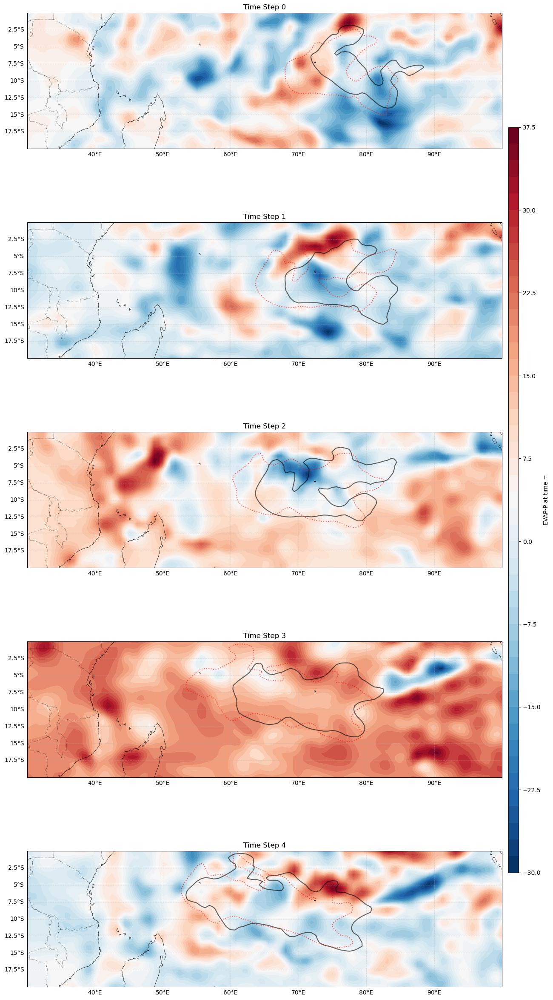

In [132]:
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import numpy as np
import matplotlib.pyplot as plt
time = data.time  # Placeholder for actual time steps in `time_diff`
lat = data.lat[lat_indices]
lon = data.lon

# Example data for TQV and DIST from `time_diff` dataset (simulated for plotting)
TQV = data.DQVDT_ANA[:,lat_indices,:]  * 86400 # Placeholder for TQV values

DIST = data.DIST[:,lat_indices,:]  # Placeholder for DIST values

# Generate the required plot with `contourf` for TQV and overlay DIST zero-value lines
fig, axes = plt.subplots(5, 1, figsize=(12, 25), subplot_kw={'projection': ccrs.PlateCarree()})

for i, ax in enumerate(axes):
    # Add map features and transparent gridlines
    ax.add_feature(cfeature.COASTLINE, linewidth=0.5)
    ax.add_feature(cfeature.BORDERS, linewidth=0.5, linestyle=':')
    gl = ax.gridlines(draw_labels=True, alpha=0.3, linestyle='--')
    gl.top_labels = gl.right_labels = False  # Disable top and right labels
    
    # Plot TQV for the current time step using contourf
    tqv_data = TQV[i]
    c = ax.contourf(lon, lat, tqv_data, levels=50, cmap='RdBu_r', transform=ccrs.PlateCarree())
    
    # Overlay the zero-value DIST lines for the current time step and next
    dist_zero_start = np.where(np.isclose(DIST[i], 0.5), 1, np.nan)
    dist_zero_end = np.where(np.isclose(DIST[i + 1], 0.5), 1, np.nan)
    
    ax.contour(lon, lat, DIST[i], levels=[1], colors='black', alpha=0.6, linestyles='-', transform=ccrs.PlateCarree(),label ='current')
    ax.contour(lon, lat, DIST[i+1], levels=[1], colors='red', alpha=0.6, linestyles=':', transform=ccrs.PlateCarree(),label='next')

    # Label each subplot with the time step and date
    ax.set_title(f'Time Step {i}', fontsize=12)
    ax.set_ylabel('Latitude', fontsize=10)

# Add a colorbar to the right of all subplots
cbar_ax = fig.add_axes([1.0, 0.15, 0.02, 0.7])  # [left, bottom, width, height]
fig.colorbar(c, cax=cbar_ax, label='EVAP-P at time =')

# Add a common x-axis label
axes[-1].set_xlabel('Longitude', fontsize=10)

# Add a suptitle for the datetime information
#fig.suptitle('TQV and DIST Zero-Value Lines for Different Time Steps', fontsize=16, y=0.93)

# Adjust layout for better readability
plt.tight_layout()  # Adjust to make room for colorbar
plt.show()


In [ ]:
data.DQVDT_ANA[:,lat_indices,:]  * 86400 

#  

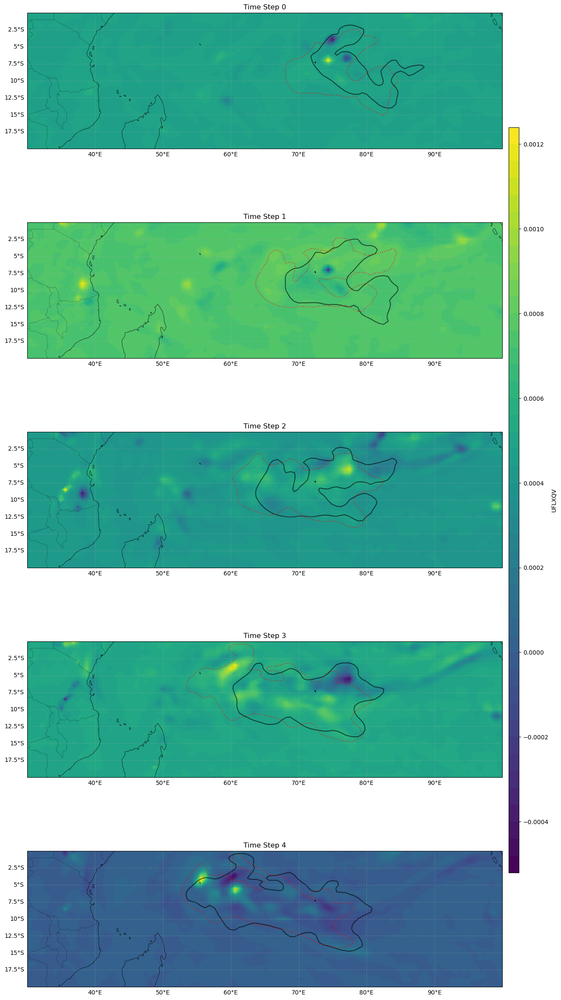

In [129]:
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import numpy as np
import matplotlib.pyplot as plt
time = time_diff.time  # Placeholder for actual time steps in `time_diff`
lat = time_diff.lat[lat_indices]
lon = time_diff.lon

# Example data for TQV and DIST from `time_diff` dataset (simulated for plotting)
TQV = time_diff.PRECTOT[:,lat_indices,:] # Placeholder for TQV values

DIST = data.DIST[:,lat_indices,:]  # Placeholder for DIST values

# Generate the required plot with `contourf` for TQV and overlay DIST zero-value lines
fig, axes = plt.subplots(5, 1, figsize=(12, 25), subplot_kw={'projection': ccrs.PlateCarree()})

for i, ax in enumerate(axes):
    # Add map features and transparent gridlines
    ax.add_feature(cfeature.COASTLINE, linewidth=0.5)
    ax.add_feature(cfeature.BORDERS, linewidth=0.5, linestyle=':')
    gl = ax.gridlines(draw_labels=True, alpha=0.3, linestyle='--')
    gl.top_labels = gl.right_labels = False  # Disable top and right labels
    
    # Plot TQV for the current time step using contourf
    tqv_data = TQV[i]
    c = ax.contourf(lon, lat, tqv_data, levels=50, cmap='viridis', transform=ccrs.PlateCarree())
    
    # Overlay the zero-value DIST lines for the current time step and next
    dist_zero_start = np.where(np.isclose(DIST[i], 0.5), 1, np.nan)
    dist_zero_end = np.where(np.isclose(DIST[i + 1], 0.5), 1, np.nan)
    
    ax.contour(lon, lat, DIST[i], levels=[1], colors='black', alpha=0.6, linestyles='-', transform=ccrs.PlateCarree(),label ='current')
    ax.contour(lon, lat, DIST[i+1], levels=[1], colors='red', alpha=0.6, linestyles=':', transform=ccrs.PlateCarree(),label='next')

    # Label each subplot with the time step and date
    ax.set_title(f'Time Step {i}', fontsize=12)
    ax.set_ylabel('Latitude', fontsize=10)

# Add a colorbar to the right of all subplots
cbar_ax = fig.add_axes([1.0, 0.15, 0.02, 0.7])  # [left, bottom, width, height]
fig.colorbar(c, cax=cbar_ax, label='UFLXQV')

# Add a common x-axis label
axes[-1].set_xlabel('Longitude', fontsize=10)

# Add a suptitle for the datetime information
#fig.suptitle('TQV and DIST Zero-Value Lines for Different Time Steps', fontsize=16, y=0.93)

# Adjust layout for better readability
plt.tight_layout()  # Adjust to make room for colorbar
plt.show()


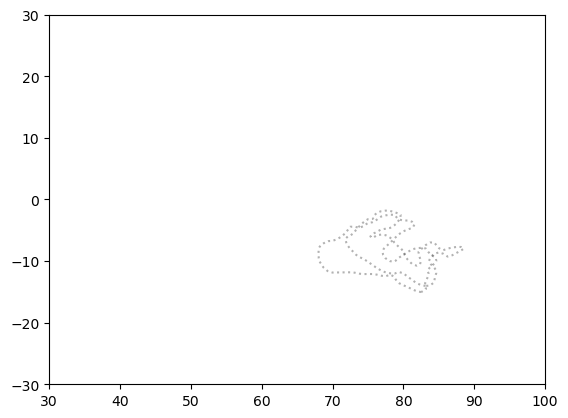

In [94]:

dist_zero_start = np.where(np.isclose(DIST[0], 0.5, atol=1), 1, np.nan)
dist_zero_end = np.where(np.isclose(DIST[1], 0.5, atol=1), 1, np.nan)

plt.contour(lon, lat, DIST[0], levels=[0], colors='black', alpha=0.3, linestyles=':', )
plt.contour(lon, lat, DIST[1], levels=[0], colors='black', alpha=0.3, linestyles=':', )


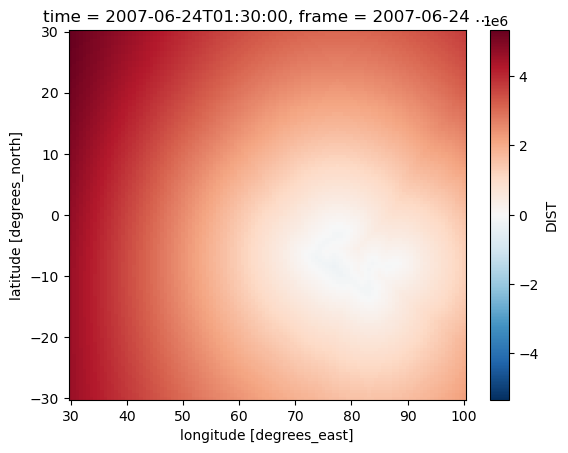

In [84]:
DIST[0].plot()

In [104]:
lat_rad

<xarray.DataArray 'lat' (lat: 121)> Size: 968B
array([-5.23598776e-01, -5.14872129e-01, -5.06145483e-01, -4.97418837e-01,
       -4.88692191e-01, -4.79965544e-01, -4.71238898e-01, -4.62512252e-01,
       -4.53785606e-01, -4.45058959e-01, -4.36332313e-01, -4.27605667e-01,
       -4.18879020e-01, -4.10152374e-01, -4.01425728e-01, -3.92699082e-01,
       -3.83972435e-01, -3.75245789e-01, -3.66519143e-01, -3.57792497e-01,
       -3.49065850e-01, -3.40339204e-01, -3.31612558e-01, -3.22885912e-01,
       -3.14159265e-01, -3.05432619e-01, -2.96705973e-01, -2.87979327e-01,
       -2.79252680e-01, -2.70526034e-01, -2.61799388e-01, -2.53072742e-01,
       -2.44346095e-01, -2.35619449e-01, -2.26892803e-01, -2.18166156e-01,
       -2.09439510e-01, -2.00712864e-01, -1.91986218e-01, -1.83259571e-01,
       -1.74532925e-01, -1.65806279e-01, -1.57079633e-01, -1.48352986e-01,
       -1.39626340e-01, -1.30899694e-01, -1.22173048e-01, -1.13446401e-01,
       -1.04719755e-01, -9.59931089e-02, -8.72664626e-02, -7.85398163e-02,
       -6.98131701e-02, -6.10865238e-02, -5.23598776e-02, -4.36332313e-02,
       -3.49065850e-02, -2.61799388e-02, -1.74532925e-02, -8.72664626e-03,
       -3.13724731e-15,  8.72664626e-03,  1.74532925e-02,  2.61799388e-02,
        3.49065850e-02,  4.36332313e-02,  5.23598776e-02,  6.10865238e-02,
        6.98131701e-02,  7.85398163e-02,  8.72664626e-02,  9.59931089e-02,
        1.04719755e-01,  1.13446401e-01,  1.22173048e-01,  1.30899694e-01,
        1.39626340e-01,  1.48352986e-01,  1.57079633e-01,  1.65806279e-01,
        1.74532925e-01,  1.83259571e-01,  1.91986218e-01,  2.00712864e-01,
        2.09439510e-01,  2.18166156e-01,  2.26892803e-01,  2.35619449e-01,
        2.44346095e-01,  2.53072742e-01,  2.61799388e-01,  2.70526034e-01,
        2.79252680e-01,  2.87979327e-01,  2.96705973e-01,  3.05432619e-01,
        3.14159265e-01,  3.22885912e-01,  3.31612558e-01,  3.40339204e-01,
        3.49065850e-01,  3.57792497e-01,  3.66519143e-01,  3.75245789e-01,
        3.83972435e-01,  3.92699082e-01,  4.01425728e-01,  4.10152374e-01,
        4.18879020e-01,  4.27605667e-01,  4.36332313e-01,  4.45058959e-01,
        4.53785606e-01,  4.62512252e-01,  4.71238898e-01,  4.79965544e-01,
        4.88692191e-01,  4.97418837e-01,  5.06145483e-01,  5.14872129e-01,
        5.23598776e-01])
Coordinates:
  * lat      (lat) float64 968B -30.0 -29.5 -29.0 -28.5 ... 28.5 29.0 29.5 30.0
Attributes:
    long_name:    latitude
    units:        degrees_north
    vmax:         1000000000000000.0
    vmin:         -1000000000000000.0
    valid_range:  [-1.e+15  1.e+15]

In [107]:
# Earth's radius in meters
R = 6371000  

# Convert degrees to radians for calculations
lat_rad = np.deg2rad(lat)  # Still 1D array

# Create 2D latitude and longitude grids
lat_grid, lon_grid = np.meshgrid(lat, lon, indexing='ij')

# Convert latitudes to radians for each grid point
lat_rad_grid = np.deg2rad(lat_grid)  # 2D grid of latitudes in radians

# Calculate zonal grid spacing (dx) in meters
d_lon = np.gradient(lon)  # Change in longitude (1D array)
dx = np.outer(np.ones(len(lat)), d_lon) * R * np.cos(lat_rad_grid)  # Shape: (lat, lon)

# Calculate meridional grid spacing (dy) in meters
d_lat = np.gradient(lat)  # Change in latitude (1D array)
dy = np.outer(d_lat, np.ones(len(lon))) * R  # Shape: (lat, lon)

# Confirm the shapes of dx and dy
print(f"dx shape: {dx.shape}, dy shape: {dy.shape}")


dx shape: (121, 113), dy shape: (121, 113)


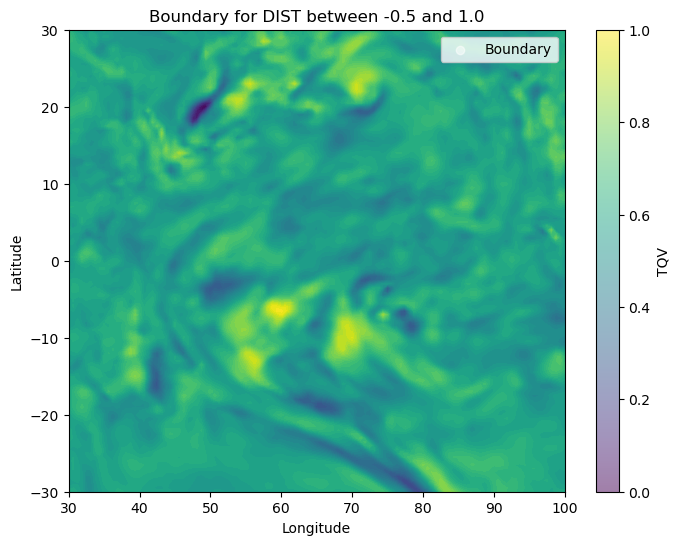

In [87]:
# Define the range for the boundary
lower_bound = -0.5
upper_bound = 1.0

# Example dist1 array
dist1 = DIST  # Assuming DIST[0] is the dataset for the first time step

# Create the mask
boundary_mask1 = (dist1 > lower_bound) & (dist1 < upper_bound)

# Extract coordinates where the mask is True
boundary_coords = np.where(boundary_mask1)

# Convert these coordinates to lat/lon
boundary_lats = lat[boundary_coords[0]]
boundary_lons = lon[boundary_coords[1]]

# Visualize the boundary over a base plot
plt.figure(figsize=(8, 6))

# Plot a base layer (e.g., TQV)
plt.contourf(lon, lat, TQV[0], levels=50, cmap='viridis')

# Overlay the boundary as points
plt.scatter(boundary_lons, boundary_lats, color='white', alpha=0.5, label='Boundary')

plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.legend()
plt.title('Boundary for DIST between -0.5 and 1.0')
plt.colorbar(label='TQV')
plt.show()


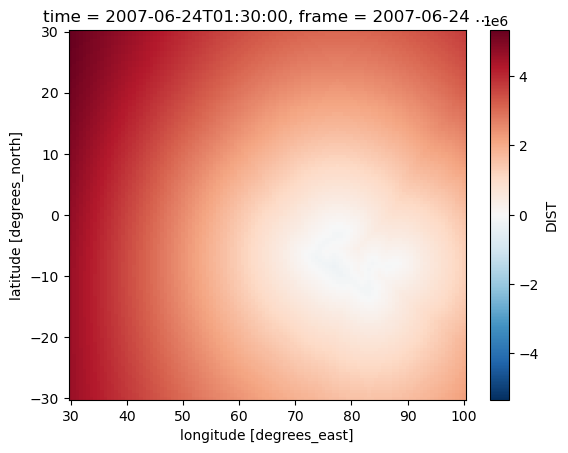

In [74]:
DIST[0].plot()

In [142]:
ds_diff =xr.concat(time_diff,dim='time')

TypeError: can only concatenate xarray Dataset and DataArray objects, got <class 'str'>

In [111]:
lat_min = -20.0  # 20°S
lat_max = 0.0    # 0°

# Identify the indices within the latitude bounds
lat_indices = np.where((lat >= lat_min) & (lat <= lat_max))[0]


In [143]:
selected_data.di

<xarray.Dataset> Size: 11MB
Dimensions:    (time: 16, lat: 121, lon: 113)
Coordinates:
  * lon        (lon) float64 904B 30.0 30.62 31.25 31.88 ... 98.75 99.38 100.0
  * lat        (lat) float64 968B -30.0 -29.5 -29.0 -28.5 ... 29.0 29.5 30.0
  * time       (time) datetime64[ns] 128B 2007-06-24T01:30:00 ... 2007-06-25T...
    frame      (time) <U21 1kB '2007-06-24 01:30:00_0' ... '2007-06-25 22:30:...
Data variables: (12/13)
    DQVDT_PHY  (time, lat, lon) float32 875kB 9.977e-06 2.392e-05 ... 1.472e-07
    DQVDT_MST  (time, lat, lon) float32 875kB 0.0 0.0 ... 1.73e-09 -8.567e-09
    DQVDT_TRB  (time, lat, lon) float32 875kB 9.976e-06 2.392e-05 ... 1.502e-07
    DQVDT_DYN  (time, lat, lon) float32 875kB 2.028e-05 4.942e-06 ... 1.071e-05
    DQVDT_ANA  (time, lat, lon) float32 875kB -3.514e-05 ... 6.223e-06
    UFLXQV     (time, lat, lon) float32 875kB 23.79 29.75 51.47 ... 34.61 37.67
    ...         ...
    SWNETTOA   (time, lat, lon) float32 875kB 0.0 0.0 0.0 ... 26.3 30.63 34.93
    LWTNET     (time, lat, lon) float32 875kB 269.3 279.5 303.5 ... 235.3 235.9
    EVAP       (time, lat, lon) float32 875kB 1.184e-05 1.648e-05 ... 1.48e-07
    PRECTOT    (time, lat, lon) float32 875kB 0.0 0.0 ... 1.029e-11 9.038e-11
    SLP        (time, lat, lon) float32 875kB 1.017e+05 1.018e+05 ... 1.005e+05
    TQV        (time, lat, lon) float32 875kB 3.503 5.133 7.522 ... 5.501 5.776
Attributes: (12/30)
    History:                           Original file generated: Thu Dec 25 19...
    Comment:                           GMAO filename: d5124_m2_jan00.tavg3_3d...
    Filename:                          MERRA2_300.tavg3_3d_rad_Nv.20070624.nc4
    Conventions:                       CF-1
    Institution:                       NASA Global Modeling and Assimilation ...
    References:                        http://gmao.gsfc.nasa.gov
    ...                                ...
    Contact:                           http://gmao.gsfc.nasa.gov
    identifier_product_doi:            10.5067/7GFQKO1T43RW
    RangeBeginningDate:                2007-06-24
    RangeBeginningTime:                00:00:00.000000
    RangeEndingDate:                   2007-06-24
    RangeEndingTime:                   23:59:59.000000

In [ ]:
# # Initialize a list to store datasets with time differences
# time_diff_datasets = []

# # Loop through datasets and calculate time differences
# for dataset in filtered_merged_data:
#     # Select only the required variables
#     selected_data = dataset[selected_vars]
    
#     # Compute the difference along the time dimension
#     time_diff = selected_data.diff(dim='time')
    
#     # Add the resulting dataset to the list
#     time_diff_datasets.append(time_diff)

# # Check one of the resulting datasets (for example, the first one)
# print(time_diff_datasets[0])

<xarray.Dataset> Size: 713kB
Dimensions:    (lat: 121, lon: 113)
Coordinates:
  * lon        (lon) float64 904B 30.0 30.62 31.25 31.88 ... 98.75 99.38 100.0
  * lat        (lat) float64 968B -30.0 -29.5 -29.0 -28.5 ... 29.0 29.5 30.0
    time       datetime64[ns] 8B 2007-06-24T01:30:00
    frame      <U21 84B '2007-06-24 01:30:00_0'
Data variables: (12/13)
    DQVDT_PHY  (lat, lon) float32 55kB ...
    DQVDT_MST  (lat, lon) float32 55kB ...
    DQVDT_TRB  (lat, lon) float32 55kB ...
    DQVDT_DYN  (lat, lon) float32 55kB ...
    DQVDT_ANA  (lat, lon) float32 55kB ...
    UFLXQV     (lat, lon) float32 55kB ...
    ...         ...
    SWNETTOA   (lat, lon) float32 55kB ...
    LWTNET     (lat, lon) float32 55kB ...
    EVAP       (lat, lon) float32 55kB ...
    PRECTOT    (lat, lon) float32 55kB ...
    SLP        (lat, lon) float32 55kB ...
    TQV        (lat, lon) float32 55kB ...
Attributes: (12/30)
    History:                           Original file generated: Thu Dec 25 19...
    

In [141]:
time_diff

<xarray.Dataset> Size: 11MB
Dimensions:    (time: 15, lat: 121, lon: 113)
Coordinates:
  * lon        (lon) float64 904B 30.0 30.62 31.25 31.88 ... 98.75 99.38 100.0
  * lat        (lat) float64 968B -30.0 -29.5 -29.0 -28.5 ... 29.0 29.5 30.0
  * time       (time) datetime64[ns] 120B 2007-06-24T04:30:00 ... 2007-06-25T...
    frame      (time) <U21 1kB '2007-06-24 04:30:00_0' ... '2007-06-25 22:30:...
Data variables: (12/13)
    DQVDT_PHY  (time, lat, lon) float32 820kB -8.7e-07 7.506e-07 ... -4.284e-07
    DQVDT_MST  (time, lat, lon) float32 820kB 0.0 0.0 ... -3.943e-08 -5.28e-07
    DQVDT_TRB  (time, lat, lon) float32 820kB -8.692e-07 7.511e-07 ... 9.519e-08
    DQVDT_DYN  (time, lat, lon) float32 820kB 2.815e-06 6.35e-05 ... -1.913e-05
    DQVDT_ANA  (time, lat, lon) float32 820kB 3.869e-05 7.544e-05 ... 4.535e-06
    UFLXQV     (time, lat, lon) float32 820kB 2.479 -6.986 ... 1.276 5.252
    ...         ...
    SWNETTOA   (time, lat, lon) float32 820kB 0.1369 0.6007 ... 30.63 34.93
    LWTNET     (time, lat, lon) float32 820kB -0.4528 -0.1273 ... -1.873 -2.5
    EVAP       (time, lat, lon) float32 820kB -1.018e-06 5.976e-07 ... 9.024e-08
    PRECTOT    (time, lat, lon) float32 820kB 0.0 0.0 ... 1.007e-11 9.035e-11
    SLP        (time, lat, lon) float32 820kB 246.4 190.4 180.4 ... 84.61 101.6
    TQV        (time, lat, lon) float32 820kB 0.2469 0.3065 ... -0.01497 0.4362
Attributes: (12/30)
    History:                           Original file generated: Thu Dec 25 19...
    Comment:                           GMAO filename: d5124_m2_jan00.tavg3_3d...
    Filename:                          MERRA2_300.tavg3_3d_rad_Nv.20070624.nc4
    Conventions:                       CF-1
    Institution:                       NASA Global Modeling and Assimilation ...
    References:                        http://gmao.gsfc.nasa.gov
    ...                                ...
    Contact:                           http://gmao.gsfc.nasa.gov
    identifier_product_doi:            10.5067/7GFQKO1T43RW
    RangeBeginningDate:                2007-06-24
    RangeBeginningTime:                00:00:00.000000
    RangeEndingDate:                   2007-06-24
    RangeEndingTime:                   23:59:59.000000

In [129]:
time_diff_datasets

[<xarray.Dataset> Size: 713kB
 Dimensions:    (lat: 121, lon: 113)
 Coordinates:
   * lon        (lon) float64 904B 30.0 30.62 31.25 31.88 ... 98.75 99.38 100.0
   * lat        (lat) float64 968B -30.0 -29.5 -29.0 -28.5 ... 29.0 29.5 30.0
     time       datetime64[ns] 8B 2007-06-24T01:30:00
     frame      <U21 84B '2007-06-24 01:30:00_0'
 Data variables: (12/13)
     DQVDT_PHY  (lat, lon) float32 55kB ...
     DQVDT_MST  (lat, lon) float32 55kB ...
     DQVDT_TRB  (lat, lon) float32 55kB ...
     DQVDT_DYN  (lat, lon) float32 55kB ...
     DQVDT_ANA  (lat, lon) float32 55kB ...
     UFLXQV     (lat, lon) float32 55kB ...
     ...         ...
     SWNETTOA   (lat, lon) float32 55kB ...
     LWTNET     (lat, lon) float32 55kB ...
     EVAP       (lat, lon) float32 55kB ...
     PRECTOT    (lat, lon) float32 55kB ...
     SLP        (lat, lon) float32 55kB ...
     TQV        (lat, lon) float32 55kB ...
 Attributes: (12/30)
     History:                           Original file generated

In [149]:
one_case = pd.DataFrame(cases[2])

In [150]:
one_case

,frame,Time,Date,Month,DateTime,geometry,area,perimeter,Effective_Radius,Centroidlat,Centroidlon,Centroid_is_inside,Perimeter_Area_Ratio,Maxlon,Minlon,Maxlat,Minlat,touches_boundary,touches_east_africa,lake_idx
0,2007-06-24 01:30:00_0,01:30,2007_06_24,06,2007-06-24 01:30:00,"POLYGON ((78.125 -1.8556103515625004, 77.5 -1....",9.153596e+05,6977.140326,539.785152,0 -8.20963 dtype: float64,0 78.594364 dtype: float64,0 True dtype: bool,0.059073,88.598680,71.819998,-1.803730,-14.033629,"0 False Name: touches_boundary, dtype: object",False,0
3,2007-06-24 04:30:00_0,04:30,2007_06_24,06,2007-06-24 04:30:00,"POLYGON ((78.125 -1.9600133446498695, 77.5 -1....",1.057559e+06,8029.436237,580.199606,0 -8.205804 dtype: float64,0 77.863759 dtype: float64,0 True dtype: bool,0.051533,87.636683,69.790903,-1.831133,-14.319702,"0 False Name: touches_boundary, dtype: object",False,0
6,2007-06-24 07:30:00_0,07:30,2007_06_24,06,2007-06-24 07:30:00,"POLYGON ((78.75 -2.444647789001465, 78.125 -2....",1.147020e+06,7766.499465,604.241505,0 -8.786601 dtype: float64,0 77.17777 dtype: float64,0 True dtype: bool,0.059741,86.378832,69.210484,-2.295666,-14.815153,"0 False Name: touches_boundary, dtype: object",False,0
8,2007-06-24 10:30:00_0,10:30,2007_06_24,06,2007-06-24 10:30:00,"POLYGON ((78.75 -2.499666728670636, 78.125 -2....",1.339185e+06,6510.592483,652.897934,0 -8.788066 dtype: float64,0 76.326166 dtype: float64,0 True dtype: bool,0.099254,84.689572,68.028913,-2.467301,-15.033313,"0 False Name: touches_boundary, dtype: object",False,0
10,2007-06-24 13:30:00_1,13:30,2007_06_24,06,2007-06-24 13:30:00,"POLYGON ((78.125 -2.434533321496211, 77.5 -2.3...",1.519345e+06,7001.096066,695.429836,1 -8.305749 dtype: float64,1 74.777509 dtype: float64,1 True dtype: bool,0.097381,83.490569,66.435080,-2.300819,-14.169413,"1 False Name: touches_boundary, dtype: object",False,1
13,2007-06-24 16:30:00_0,16:30,2007_06_24,06,2007-06-24 16:30:00,"POLYGON ((76.25 -1.9752332899305571, 76.041030...",1.681731e+06,7593.887319,731.649844,0 -7.908175 dtype: float64,0 74.025543 dtype: float64,0 True dtype: bool,0.091617,84.485218,65.021059,-1.975233,-13.453671,"0 False Name: touches_boundary, dtype: object",False,0
17,2007-06-24 19:30:00_0,19:30,2007_06_24,06,2007-06-24 19:30:00,"POLYGON ((76.875 -2.3840314777495593, 76.25 -2...",1.523605e+06,9210.456195,696.403971,0 -8.094216 dtype: float64,0 73.420791 dtype: float64,0 True dtype: bool,0.056423,84.457658,63.660032,-2.260969,-13.113019,"0 False Name: touches_boundary, dtype: object",False,0
18,2007-06-24 22:30:00_0,22:30,2007_06_24,06,2007-06-24 22:30:00,"POLYGON ((78.125 -2.887818453604716, 77.5 -2.7...",1.607956e+06,9654.427101,715.421805,0 -8.135236 dtype: float64,0 72.697945 dtype: float64,0 True dtype: bool,0.054196,83.834749,62.692431,-2.687175,-13.434353,"0 False Name: touches_boundary, dtype: object",False,0
20,2007-06-25 01:30:00_0,01:30,2007_06_25,06,2007-06-25 01:30:00,"POLYGON ((78.125 -2.8380484681835334, 77.5 -2....",1.884754e+06,6928.188321,774.555250,0 -8.250066 dtype: float64,0 72.085079 dtype: float64,0 True dtype: bool,0.123357,82.925115,61.742025,-2.838048,-13.829444,"0 False Name: touches_boundary, dtype: object",False,0
22,2007-06-25 04:30:00_0,04:30,2007_06_25,06,2007-06-25 04:30:00,"POLYGON ((78.125 -3.4047204171132925, 77.5 -3....",1.914132e+06,6946.381583,780.568422,0 -8.389233 dtype: float64,0 71.128259 dtype: float64,0 True dtype: bool,0.124625,82.533646,60.299709,-3.146906,-14.047551,"0 False Name: touches_boundary, dtype: object",False,0


In [151]:
# Ensure 'one_case' DataFrame is prepared
one_case['geometry'] = one_case['geometry'].astype(str)
one_case['DateTime'] = pd.to_datetime(one_case['DateTime'])

# Define the variable to plot from time_diff_datasets (e.g., 'TQV')
selected_variable = "TQV"

# Extract 12-hour intervals from the first dataset in the list
# Create a new list to store datasets with 12-hour intervals
selected_data_list = []
for dataset in time_diff_datasets:
    if selected_variable in dataset:
        selected_data_list.append(dataset[selected_variable])

selected_data_12hr = selected_data_list[::4]

In [1]:
time_diff_12hr

NameError: name 'time_diff_12hr' is not defined

In [153]:
# Define the number of subplots based on the number of time steps
num_subplots = len(time_diff_12hr)
ncols = 1
nrows = num_subplots  

In [156]:
# Create the figure and axis
fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(8, nrows * 5), dpi=500,
                         subplot_kw={'projection': ccrs.PlateCarree()})

# Flatten axes array for easy iteration
if nrows == 1:
    axes = [axes]  # Ensure axes is always a list, even for a single subplot
print(axes)
# List to store centroid positions for plotting lines
centroids = []

# Plot each time step
for i, ax in enumerate(axes):
    if i < num_subplots:
        time_step = time_diff_12hr[i].time
        data_slice = time_diff_12hr['TQV'].sel(time=time_step)

        # Plot the selected variable's difference data
        im = data_slice.plot(ax=ax, cmap='coolwarm', add_colorbar=(i == num_subplots - 1))
        
        # Add Cartopy features
        ax.set_extent([30, 100, -30, 30], crs=ccrs.PlateCarree())
        ax.add_feature(cfeature.COASTLINE)
        ax.add_feature(cfeature.BORDERS, linestyle=':')
        ax.add_feature(cfeature.LAND, color='lightgray')
        ax.add_feature(cfeature.OCEAN, color='white')

        # Overlay polygons for the same datetime
        datetime = pd.to_datetime(time_step)
        if datetime in one_case['DateTime'].values:
            group = one_case[one_case['DateTime'] == datetime]
            for _, row in group.iterrows():
                poly = wkt.loads(row['geometry'])
                x, y = poly.exterior.xy
                ax.plot(x, y, color='red', linewidth=1.5)

                # Mark and collect centroid
                centroid_x = row['Centroidlon']
                centroid_y = row['Centroidlat']
                ax.plot(centroid_x, centroid_y, 'bo', markersize=5)  # Mark the centroid
                centroids.append((centroid_x, centroid_y))
        
        ax.set_title(f"Variable Difference at {datetime}")
    else:
        ax.axis('off')  # Turn off unused subplots

# Connect the centroids with lines
for i in range(1, len(centroids)):
    axes[i].plot([centroids[i-1][0], centroids[i][0]],
                 [centroids[i-1][1], centroids[i][1]], 'b--', transform=ccrs.PlateCarree())

plt.tight_layout()
plt.show()

[<GeoAxes: > <GeoAxes: > <GeoAxes: > <GeoAxes: > <GeoAxes: > <GeoAxes: >
 <GeoAxes: > <GeoAxes: > <GeoAxes: > <GeoAxes: > <GeoAxes: > <GeoAxes: >
 <GeoAxes: >]


KeyError: "No variable named 0. Variables on the dataset include ['DQVDT_PHY', 'DQVDT_MST', 'DQVDT_TRB', 'DQVDT_DYN', 'DQVDT_ANA', ..., 'TQV', 'lon', 'lat', 'time', 'frame']"

In [51]:
all_gdflakes

[<xarray.Dataset> Size: 27MB
 Dimensions:     (lev: 35, lat: 121, lon: 113)
 Coordinates:
   * lon         (lon) float64 904B 30.0 30.62 31.25 31.88 ... 98.75 99.38 100.0
   * lat         (lat) float64 968B -30.0 -29.5 -29.0 -28.5 ... 29.0 29.5 30.0
   * lev         (lev) float64 280B 38.0 39.0 40.0 41.0 ... 69.0 70.0 71.0 72.0
     time        datetime64[ns] 8B 2007-06-24T01:30:00
     frame       <U21 84B '2007-06-24 01:30:00_0'
     pressure    (lev) float64 280B 92.37 108.7 127.8 150.4 ... 955.0 970.0 985.0
 Data variables: (12/50)
     CLOUD       (lev, lat, lon) float32 2MB ...
     DELP        (lev, lat, lon) float32 2MB ...
     DTDTLWR     (lev, lat, lon) float32 2MB ...
     DTDTLWRCLR  (lev, lat, lon) float32 2MB ...
     DTDTSWR     (lev, lat, lon) float32 2MB ...
     DTDTSWRCLR  (lev, lat, lon) float32 2MB ...
     ...          ...
     EVAP        (lat, lon) float32 55kB ...
     PRECTOT     (lat, lon) float32 55kB ...
     SLP         (lat, lon) float32 55kB ...
     TQ

In [77]:
sequences[1]

[frame                                               2014-01-08 04:30:00_0
 Time                                                                04:30
 Date                                                           2014_01_08
 Month                                                                  01
 DateTime                                              2014-01-08 04:30:00
 geometry                POLYGON ((40.625 -12.124329842177012, 40.30840...
 area                                                        915692.801507
 perimeter                                                     5403.463986
 Effective_Radius                                               539.883387
 Centroidlat                                 0   -18.686885
 dtype: float64
 Centroidlon                                 0    40.643283
 dtype: float64
 Centroid_is_inside                                  0    True
 dtype: bool
 Perimeter_Area_Ratio                                             0.098527
 Maxlon               

In [50]:
cases[1]

,frame,Time,Date,Month,DateTime,geometry,area,perimeter,Effective_Radius,Centroidlat,Centroidlon,Centroid_is_inside,Perimeter_Area_Ratio,Maxlon,Minlon,Maxlat,Minlat,touches_boundary,touches_east_africa,lake_idx
6,2014-01-08 04:30:00_0,04:30,2014_01_08,01,2014-01-08 04:30:00,"POLYGON ((40.62500 -12.12433, 40.30840 -12.500...",9.156928e+05,5403.463986,539.883387,0 -18.686885 dtype: float64,0 40.643283 dtype: float64,0 True dtype: bool,0.098527,46.132914,33.645098,-12.124330,-23.824571,"0 False Name: touches_boundary, dtype: object",True,0
7,2014-01-08 04:30:00_10,04:30,2014_01_08,01,2014-01-08 04:30:00,"POLYGON ((70.62500 -2.26230, 70.13241 -2.50000...",3.252665e+05,2364.214164,321.769417,10 -5.534156 dtype: float64,10 70.294826 dtype: float64,10 True dtype: bool,0.182817,74.071229,66.747831,-2.262304,-8.116795,"10 False Name: touches_boundary, dtype: object",False,10
8,2014-01-08 04:30:00_11,04:30,2014_01_08,01,2014-01-08 04:30:00,"POLYGON ((78.12500 -2.95106, 77.93615 -3.00000...",2.096748e+05,2282.468991,258.343906,11 -4.997071 dtype: float64,11 78.378739 dtype: float64,11 True dtype: bool,0.126441,82.576762,74.729870,-2.951058,-7.543418,"11 False Name: touches_boundary, dtype: object",False,11
9,2014-01-08 04:30:00_17,04:30,2014_01_08,01,2014-01-08 04:30:00,"POLYGON ((53.44286 -30.00000, 53.37208 -29.500...",2.836132e+06,14443.475288,950.141460,17 -16.74566 dtype: float64,17 56.380097 dtype: float64,17 False dtype: bool,0.042710,67.687214,44.914550,-2.991714,-30.000000,"17 True Name: touches_boundary, dtype: object",True,17
10,2014-01-08 04:30:00_18,04:30,2014_01_08,01,2014-01-08 04:30:00,"POLYGON ((100.00000 -0.56302, 99.93112 -0.5000...",1.201483e+06,8003.910587,618.420393,18 -6.727741 dtype: float64,18 95.839281 dtype: float64,18 True dtype: bool,0.058920,100.000000,89.496165,2.982217,-13.105861,"18 True Name: touches_boundary, dtype: object",False,18
11,2014-01-08 04:30:00_7,04:30,2014_01_08,01,2014-01-08 04:30:00,"POLYGON ((78.12500 -7.82454, 77.50000 -7.64830...",2.093695e+05,2262.106433,258.155705,7 -10.296625 dtype: float64,7 76.261578 dtype: float64,7 True dtype: bool,0.128540,78.464637,73.167086,-7.648299,-12.748544,"7 False Name: touches_boundary, dtype: object",False,7
12,2014-01-08 04:30:00_8,04:30,2014_01_08,01,2014-01-08 04:30:00,"POLYGON ((86.87500 -5.88167, 86.58560 -6.00000...",2.494959e+05,2278.021839,281.810213,8 -7.82559 dtype: float64,8 82.899862 dtype: float64,8 True dtype: bool,0.151042,87.265323,79.552708,-5.759300,-10.381704,"8 False Name: touches_boundary, dtype: object",False,8


In [18]:
def find_consecutive_cases(df, time_delta='3H', min_sequence=6, lat_thresh=10.0, lon_thresh=10.0):
    # Ensure 'DateTime' is in datetime format
    df['DateTime'] = pd.to_datetime(df['DateTime'])
    # Sort DataFrame by 'DateTime'
    df = df.sort_values('DateTime').reset_index(drop=True)

    # List to store consecutive cases
    consecutive_cases = []
    current_consecutive = [df.iloc[0]]

    # Iterate through rows using itertuples for faster access
    for i, current_row in enumerate(df.itertuples(index=False), start=1):
        if i == len(df):  # Skip iteration if it's the last row
            break

        # Access previous row (i-1) and current row for comparisons
        prev_row = current_consecutive[-1]

        # Check time difference
        if (current_row.DateTime - prev_row.DateTime) == pd.Timedelta(time_delta):
            # Check if centroids are within threshold
            if (abs(current_row.Centroidlat - prev_row.Centroidlat) <= lat_thresh and
                abs(current_row.Centroidlon - prev_row.Centroidlon) <= lon_thresh):
                current_consecutive.append(current_row)
            else:
                # If minimum sequence length met, add to result list
                if len(current_consecutive) >= min_sequence:
                    consecutive_cases.append(current_consecutive)
                current_consecutive = [current_row]
        else:
            # If minimum sequence length met, add to result list
            if len(current_consecutive) >= min_sequence:
                consecutive_cases.append(current_consecutive)
            current_consecutive = [current_row]

    # Include the last tracked sequence if it meets minimum sequence length
    if len(current_consecutive) >= min_sequence:
        consecutive_cases.append(current_consecutive)

    return consecutive_cases

# Example call to function
cases = find_consecutive_cases(gdf)


ValueError: The truth value of a Series is ambiguous. Use a.empty, a.bool(), a.item(), a.any() or a.all().

In [38]:
cases

[]

In [15]:
ds = xr.open_dataset('merged_ds.nc')

In [23]:
ds.DIST.isel(time =0)

<xarray.DataArray 'DIST' (lat: 121, lon: 113)> Size: 109kB
[13673 values with dtype=float64]
Coordinates:
  * lon      (lon) float64 904B 30.0 30.62 31.25 31.88 ... 98.75 99.38 100.0
  * lat      (lat) float64 968B -30.0 -29.5 -29.0 -28.5 ... 28.5 29.0 29.5 30.0
    time     datetime64[ns] 8B 2007-06-24T01:30:00

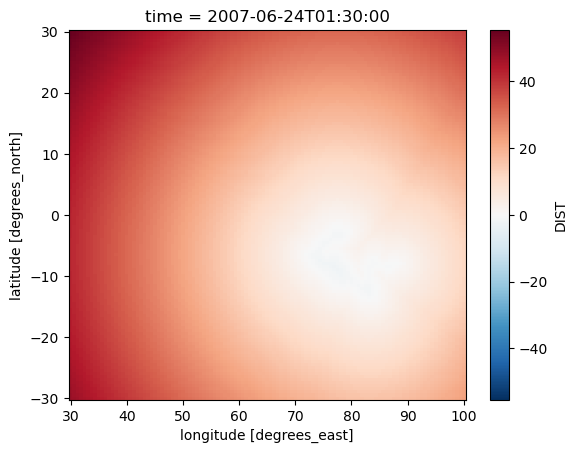

In [20]:
ds.DIST.isel(time =0).plot()

In [214]:
dist.min()/1000

-0.0014434079799924534

In [ ]:
# Assume ds is your dataset
lev_index = 0  # specify the level index or level value for which to calculate components

# Select U, V, and DIST at the desired level
u = ds['U'].isel(lev=lev_index)
v = ds['V'].isel(lev=lev_index)
dist = ds['DIST']/1000

# Boundary range for DIST values
lower_bound = -500
upper_bound = 500
boundary_mask = (dist > lower_bound) & (dist < upper_bound)

In [28]:
x,y=np.gradient(dist.values)

ValueError: too many values to unpack (expected 2)

In [ ]:
# Calculate the gradient of DIST to get the normal direction
grad_y,  = np.gradient(dist.values,  )



magnitude = np.sqrt(grad_x**2 + grad_y**2)

# Normalize to get unit normal vectors, handling NaNs
normal_x = np.nan_to_num(grad_x / magnitude)
normal_y = np.nan_to_num(grad_y / magnitude)

# Calculate tangential vectors
tangential_x = -normal_y
tangential_y = normal_x

# Apply boundary mask
normal_x_boundary = np.where(boundary_mask, normal_x, np.nan)
normal_y_boundary = np.where(boundary_mask, normal_y, np.nan)
tangential_x_boundary = np.where(boundary_mask, tangential_x, np.nan)
tangential_y_boundary = np.where(boundary_mask, tangential_y, np.nan)

# Project U and V onto normal and tangential directions
F_normal_x = u * normal_x_boundary 
F_normal_y = v * normal_y_boundary
F_tangential_x = u * tangential_x_boundary 
F_tangential_y = v * tangential_y_boundary
# # Create new DataArrays for normal and tangential components
# F_normal_da = xr.DataArray(F_normal, coords=[ds['lat'], ds['lon']], dims=['lat', 'lon'], name="F_normal")
# F_tangential_da = xr.DataArray(F_tangential, coords=[ds['lat'], ds['lon']], dims=['lat', 'lon'], name="F_tangential")

# # Add the normal and tangential components to the dataset
# ds['F_normal'] = F_normal_da
# ds['F_tangential'] = F_tangential_da

# Plot normal and tangential vectors along with DIST
plt.figure(figsize=(12, 6))
plt.contourf(ds.lon, ds.lat, ds.TQV, cmap='viridis', extend='both')
plt.colorbar(label='DIST')

# Plot normal vectors in red
plt.quiver(ds.lon, ds.lat, normal_x_boundary, normal_y_boundary, color='red', label='Normal Vectors', scale=50)

# Plot tangential vectors in blue
plt.quiver(ds.lon, ds.lat, tangential_x_boundary, tangential_y_boundary, color='blue', label='Tangential Vectors', scale=50)

# plt.xlim([60, 75])
# plt.ylim([-25, -15])
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('Normal and Tangential Vectors at Selected Level')
plt.legend()
plt.savefig('normal_tangential_vectors.png', dpi=300, bbox_inches='tight')
plt.show()

ValueError: too many values to unpack (expected 1)

In [14]:
import numpy as np
import matplotlib.pyplot as plt
import xarray as xr

# Assuming 'ds' is your dataset
lev_index = 0  # specify the level index or level value for which to calculate components

# Select U, V, and DIST at the desired level
u = ds['U'].isel(lev=lev_index,time =0)
v = ds['V'].isel(lev=lev_index,time =0)
dist = ds['DIST'].isel(time =0) / 1000  # Distance in km (assuming original is in meters)

# Boundary range for DIST values
lower_bound = -500
upper_bound = 500
boundary_mask = (dist > lower_bound) & (dist < upper_bound)

# Calculate the gradient of DIST using np.gradient (for uniformly spaced grid)
grad_y, grad_x = np.gradient(dist.values, axis=(1, 0))  # gradient along lat (axis 1) and lon (axis 2)

# Compute the magnitude of the gradient
magnitude = np.sqrt(grad_x**2 + grad_y**2)

# Normalize to get unit normal vectors, handling NaNs
normal_x = np.nan_to_num(grad_x / magnitude)
normal_y = np.nan_to_num(grad_y / magnitude)

# Calculate tangential vectors (90-degree rotation of normal)
tangential_x = -normal_y
tangential_y = normal_x

# Apply boundary mask to isolate boundary regions
normal_x_boundary = np.where(boundary_mask, normal_x, np.nan)
normal_y_boundary = np.where(boundary_mask, normal_y, np.nan)
tangential_x_boundary = np.where(boundary_mask, tangential_x, np.nan)
tangential_y_boundary = np.where(boundary_mask, tangential_y, np.nan)

# Project U and V onto normal and tangential directions
F_normal_x = u * normal_x_boundary
F_normal_y = v * normal_y_boundary
F_tangential_x = u * tangential_x_boundary
F_tangential_y = v * tangential_y_boundary

# Plot normal and tangential vectors along with DIST
plt.figure(figsize=(12, 6))
plt.contourf(ds.lon, ds.lat, dist, cmap='viridis', extend='both')
plt.colorbar(label='DIST (km)')

# Plot normal vectors in red
plt.quiver(ds.lon, ds.lat, normal_x_boundary, normal_y_boundary, color='red', label='Normal Vectors', scale=50)

# Plot tangential vectors in blue
plt.quiver(ds.lon, ds.lat, tangential_x_boundary, tangential_y_boundary, color='blue', label='Tangential Vectors', scale=50)

# Labeling the plot
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('Normal and Tangential Vectors at Selected Level')
plt.legend()
plt.savefig('normal_tangential_vectors.png', dpi=300, bbox_inches='tight')
plt.show()


NameError: name 'ds' is not defined

In [48]:
dist

<xarray.DataArray 'DIST' (time: 7, lat: 121, lon: 113)> Size: 766kB
array([[[0.04777703, 0.0472266 , 0.04667804, ..., 0.0219213 ,
         0.02233773, 0.02276371],
        [0.04754361, 0.04699044, 0.04643909, ..., 0.02154746,
         0.02197099, 0.02240394],
        [0.04731432, 0.04675844, 0.04620432, ..., 0.02117884,
         0.02160959, 0.02204964],
        ...,
        [0.05464961, 0.05417108, 0.05369557, ..., 0.03679879,
         0.03712575, 0.03746028],
        [0.05497117, 0.05449547, 0.05402281, ..., 0.03722769,
         0.03755091, 0.03788169],
        [0.05529539, 0.0548225 , 0.05435268, ..., 0.03765834,
         0.0379779 , 0.03830499]],

       [[0.04622742, 0.04568769, 0.04515016, ..., 0.02204305,
         0.02247754, 0.02292083],
        [0.04597882, 0.04543614, 0.04489559, ..., 0.02168285,
         0.02212441, 0.02257464],
        [0.04573433, 0.04518871, 0.04464517, ..., 0.02132829,
         0.02177705, 0.02223431],
...
        [0.04911447, 0.04865929, 0.04820791, ..., 0.03603032,
         0.03628572, 0.03655002],
        [0.04945686, 0.04900486, 0.0485567 , ..., 0.03648882,
         0.03674103, 0.03700208],
        [0.04980192, 0.04935308, 0.04890811, ..., 0.03694839,
         0.03719749, 0.03745536]],

       [[0.03847623, 0.03793949, 0.03740549, ..., 0.02565115,
         0.02612644, 0.02660792],
        [0.03822429, 0.03768396, 0.03714628, ..., 0.02532629,
         0.02580756, 0.02629478],
        [0.03797725, 0.03743336, 0.03689203, ..., 0.02500721,
         0.02549439, 0.02598238],
        ...,
        [0.04851715, 0.04806699, 0.04762078, ..., 0.03654718,
         0.03680811, 0.03707774],
        [0.04886373, 0.04841679, 0.04797383, ..., 0.0370037 ,
         0.03726143, 0.0375278 ],
        [0.04921295, 0.04876921, 0.04832948, ..., 0.03746132,
         0.03771593, 0.03797912]]])
Coordinates:
  * lon      (lon) float64 904B 30.0 30.62 31.25 31.88 ... 98.75 99.38 100.0
  * lat      (lat) float64 968B -30.0 -29.5 -29.0 -28.5 ... 28.5 29.0 29.5 30.0
  * time     (time) datetime64[ns] 56B 2007-06-24T01:30:00 ... 2007-06-24T22:...

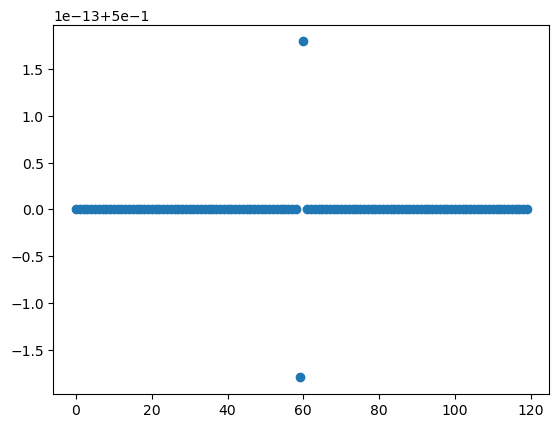

In [40]:
plt.scatter(range(np.shape(lat_spacing)[0]),lat_spacing)

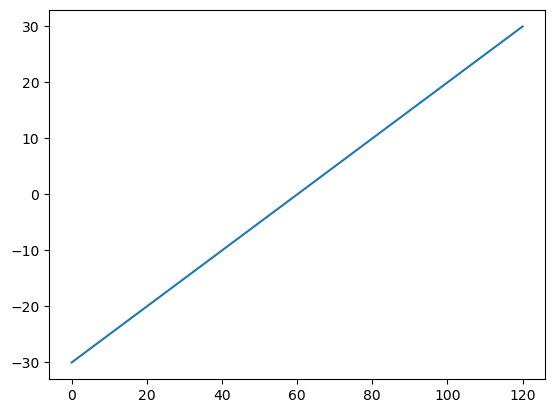

In [46]:
plt.plot(lat)

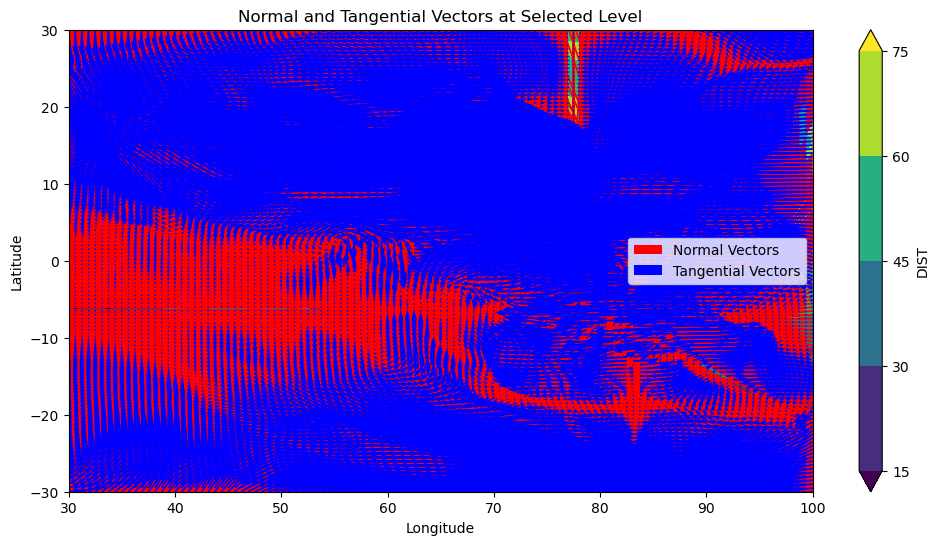

In [56]:
# Assume ds is your dataset
lev_index = 0  # specify the level index or level value for which to calculate components

# Select U, V, and DIST at the desired level
# u = ds['U'].isel(lev=lev_index)
# v = ds['V'].isel(lev=lev_index)
uflx = ds['UFLXQV'].isel(time =0)
vflx = ds['VFLXQV'].isel(time =0)
dist = ds['DIST'].isel(time =0)/1000

# Boundary range for DIST values
lower_bound = -0.5
upper_bound = 0.5
boundary_mask = (dist > lower_bound) & (dist < upper_bound)

# Calculate the gradient of DIST to get the normal direction
grad_y, grad_x = np.gradient(dist.values, ds['lat'].values, ds['lon'].values)
magnitude = np.sqrt(grad_x**2 + grad_y**2)

# Normalize to get unit normal vectors, handling NaNs
normal_x = np.nan_to_num(grad_x / magnitude)
normal_y = np.nan_to_num(grad_y / magnitude)

# Calculate tangential vectors
tangential_x = -normal_y
tangential_y = normal_x

# Apply boundary mask
normal_x_boundary = np.where(boundary_mask, normal_x, np.nan)
normal_y_boundary = np.where(boundary_mask, normal_y, np.nan)
tangential_x_boundary = np.where(boundary_mask, tangential_x, np.nan)
tangential_y_boundary = np.where(boundary_mask, tangential_y, np.nan)

# Explicitly perform the dot product for the projection
F_normal = (uflx * normal_x_boundary + vflx * normal_y_boundary)
F_tangential = (uflx * tangential_x_boundary + vflx * tangential_y_boundary)
F_normal_x = F_normal * normal_x_boundary 
F_normal_y = F_normal * normal_y_boundary
F_tangential_x = F_tangential_x * tangential_x_boundary 
F_tangential_y = F_tangential_y * tangential_y_boundary
# # Create new DataArrays for normal and tangential components
# F_normal_da = xr.DataArray(F_normal, coords=[ds['lat'], ds['lon']], dims=['lat', 'lon'], name="F_normal")
# F_tangential_da = xr.DataArray(F_tangential, coords=[ds['lat'], ds['lon']], dims=['lat', 'lon'], name="F_tangential")

# # Add the normal and tangential components to the dataset
# ds['F_normal'] = F_normal_da
# ds['F_tangential'] = F_tangential_da

# Plot normal and tangential vectors along with DIST
plt.figure(figsize=(12, 6))
plt.contourf(ds.lon, ds.lat, ds.TQV.isel(time =0), cmap='viridis', extend='both')
plt.colorbar(label='DIST')

# Plot normal vectors in red
plt.quiver(ds.lon, ds.lat, F_normal_x, F_normal_y, color='red', label='Normal Vectors', scale=100)

# Plot tangential vectors in blue
plt.quiver(ds.lon, ds.lat, F_tangential_x, F_tangential_y, color='blue', label='Tangential Vectors', scale=100)


plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('Normal and Tangential Vectors at Selected Level')
plt.legend()
plt.savefig('normal_tangential_vectors.png', dpi=300, bbox_inches='tight')
plt.show()


(-25.0, -15.0)

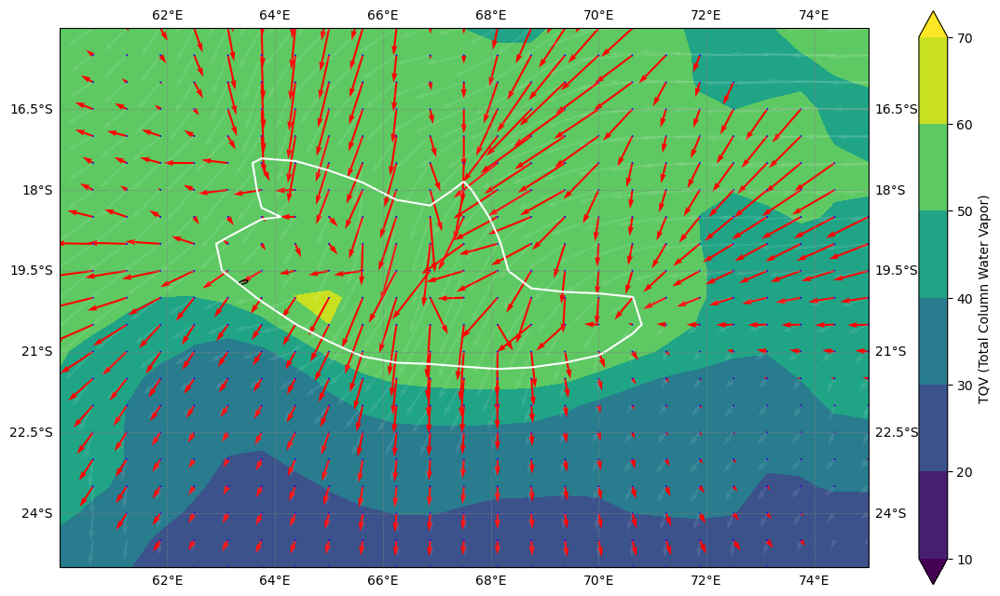

In [237]:
# Plotting with Cartopy
import cartopy.crs as ccrs
import cartopy.feature as cfeature
plt.figure(figsize=(14, 8))
ax = plt.axes(projection=ccrs.PlateCarree())

# Filled contour plot of TQV
contourf_tqv = plt.contourf(ds.lon, ds.lat, ds.TQV,  cmap='viridis', transform=ccrs.PlateCarree(), extend='both')
plt.colorbar(contourf_tqv, label='TQV (Total Column Water Vapor)')
# Add coastlines and gridlines
ax.coastlines()
ax.gridlines(draw_labels=True, linestyle=':', color='gray')
# Plot dist == 0 contour line (lake boundary)
boundary_contour = plt.contour(ds.lon, ds.lat, ds.DIST, levels=[0], colors='white', linewidths=1.5, transform=ccrs.PlateCarree())
boundary_contour.collections[0].set_label('Lake Boundary (dist = 0)')
# Plot quiver vectors for normal and tangential vectors at the boundary
plt.quiver(ds.lon, ds.lat, F_normal_x, F_normal_y,color='red', transform=ccrs.PlateCarree(), scale=4e3, label='Normal Vectors')
plt.quiver(ds.lon, ds.lat, F_tangential_x, F_tangential_y, color='blue', transform=ccrs.PlateCarree(), scale=4e3, label='Tangential Vectors')
#plt.quiver(lon2d, lat2d, ds.isel(lev = 0).U, ds.isel(lev = 0).V  ,color='white', scale = 200, alpha = 0.8)
plt.quiver(lon2d, lat2d, uflx, vflx  ,color='white', scale = 4e3, alpha = 0.1)
plt.xlim([60, 75])
plt.ylim([-25, -15])

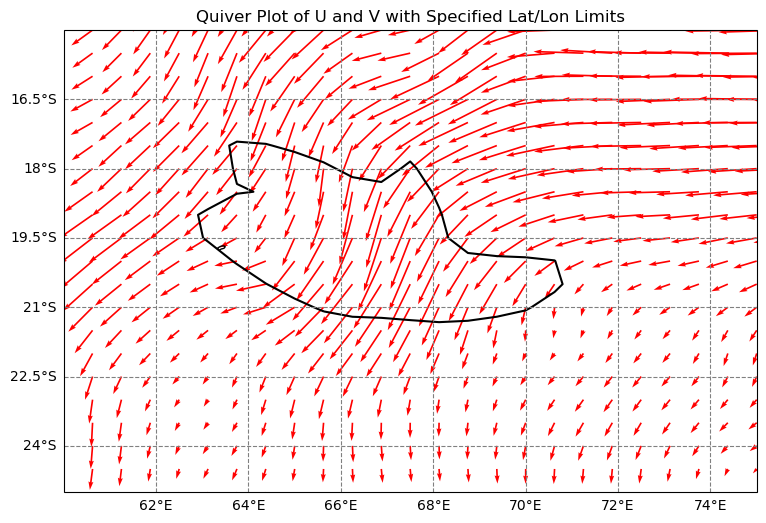

In [238]:
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature

# Initialize figure with Cartopy projection
plt.figure(figsize=(10, 6))
ax = plt.axes(projection=ccrs.PlateCarree())
ax.set_extent([60, 75, -25, -15], crs=ccrs.PlateCarree())  # Set longitude and latitude limits

# Add coastlines and gridlines
ax.coastlines()
ax.add_feature(cfeature.BORDERS, linestyle=':')
gl = ax.gridlines(draw_labels=True, linestyle='--', color='gray')
gl.top_labels = gl.right_labels = False  # Hide top and right labels for clarity
lon2d, lat2d = np.meshgrid(ds.lon,ds.lat)
# Plot quiver vectors for U and V components
# Ensure `lon2d` and `lat2d` match the shapes of `ds.V` and `ds.U`
quiver = ax.quiver(lon2d, lat2d, ds.UFLXQV, ds.VFLXQV  ,color='red', scale = 4e3)
boundary_contour = plt.contour(ds.lon, ds.lat, ds.DIST, levels=[0], colors='black', linewidths=1.5, transform=ccrs.PlateCarree())
boundary_contour.collections[0].set_label('Lake Boundary (dist = 0)')
# Uncomment and replace with tangential components if desired
# ax.quiver(lon2d, lat2d, F_tangential_x, F_tangential_y, color='blue', transform=ccrs.PlateCarree(), scale=50, label='Tangential Vectors')

# Set labels and title
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('Quiver Plot of U and V with Specified Lat/Lon Limits')

plt.show()


In [239]:
# Explicitly perform the dot product for the projection
F_normal = (uflx * normal_x_boundary + vflx * normal_y_boundary)
F_tangential = (uflx * tangential_x_boundary + vflx * tangential_y_boundary)

# Decompose F_normal and F_tangential into x and y components
F_normal_x = F_normal * normal_x_boundary 
F_normal_y = F_normal * normal_y_boundary
F_tangential_x = F_tangential * tangential_x_boundary 
F_tangential_y = F_tangential * tangential_y_boundary

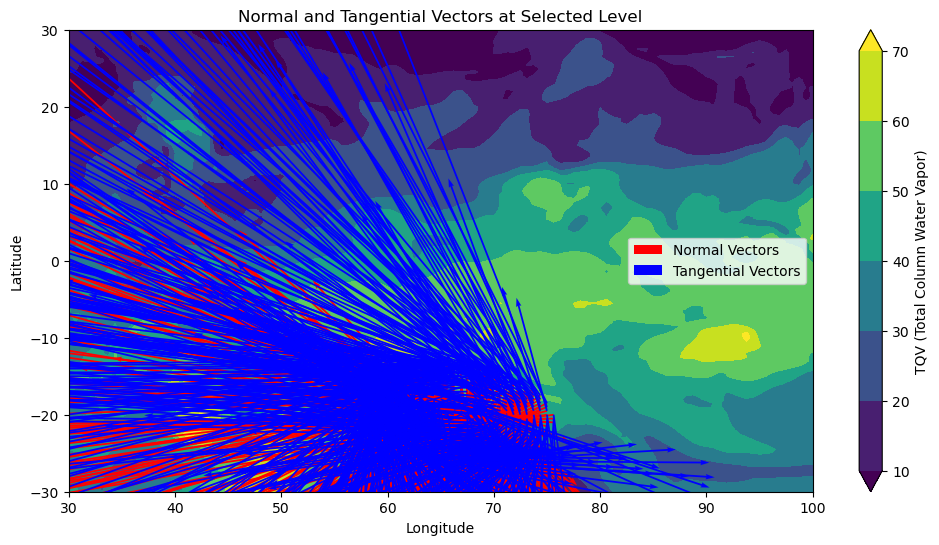

In [240]:
# Plot normal and tangential vectors along with DIST using matplotlib
plt.figure(figsize=(12, 6))

# Filled contour plot for TQV
plt.contourf(ds.lon, ds.lat, ds.TQV, cmap='viridis', extend='both')
plt.colorbar(label='TQV (Total Column Water Vapor)')

# Plot normal vectors in red
plt.quiver(ds.lon, ds.lat, F_normal_x, F_normal_y, color='red', label='Normal Vectors', scale=100)

# Plot tangential vectors in blue
plt.quiver(ds.lon, ds.lat, F_tangential_x, F_tangential_y, color='blue', label='Tangential Vectors', scale=100)

# Labeling
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('Normal and Tangential Vectors at Selected Level')
plt.legend()
plt.savefig('normal_tangential_vectors.png', dpi=300, bbox_inches='tight')
plt.show()

(-25.0, -15.0)

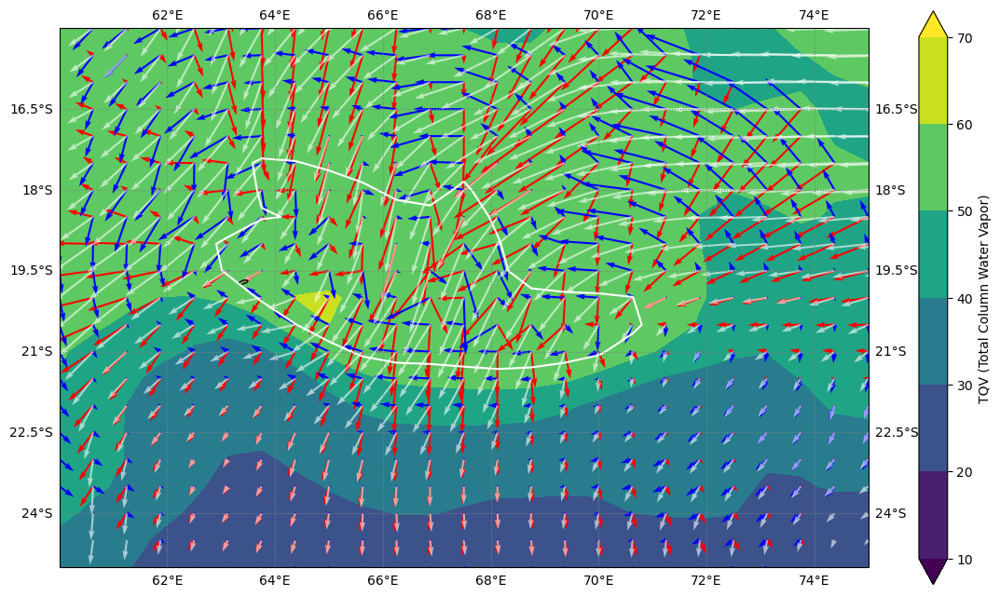

In [241]:
plt.figure(figsize=(14, 8))
ax = plt.axes(projection=ccrs.PlateCarree())

# Filled contour plot of TQV
contourf_tqv = plt.contourf(ds.lon, ds.lat, ds.TQV,  cmap='viridis', transform=ccrs.PlateCarree(), extend='both')
plt.colorbar(contourf_tqv, label='TQV (Total Column Water Vapor)')
# Add coastlines and gridlines
ax.coastlines()
ax.gridlines(draw_labels=True, linestyle=':', color='gray')
# Plot dist == 0 contour line (lake boundary)
boundary_contour = plt.contour(ds.lon, ds.lat, ds.DIST, levels=[0], colors='white', linewidths=1.5, transform=ccrs.PlateCarree())
boundary_contour.collections[0].set_label('Lake Boundary (dist = 0)')
# Plot quiver vectors for normal and tangential vectors at the boundary
plt.quiver(ds.lon, ds.lat, F_normal_x, F_normal_y,color='red', transform=ccrs.PlateCarree(), scale=4e3, label='Normal Vectors')
plt.quiver(ds.lon, ds.lat, F_tangential_x, F_tangential_y, color='blue', transform=ccrs.PlateCarree(), scale=4e3, label='Tangential Vectors')
plt.quiver(lon2d, lat2d, uflx, vflx  ,color='white', scale = 4e3, alpha = 0.6)
plt.xlim([60, 75])
plt.ylim([-25, -15])

In [79]:
ds_test = xr.open_dataset('merged_ds.nc')

In [80]:
ds = ds_test

In [81]:
ds

<xarray.Dataset> Size: 248MB
Dimensions:                          (time: 7, lev: 35, lat: 121, lon: 113)
Coordinates:
  * lon                              (lon) float64 904B 30.0 30.62 ... 100.0
  * lat                              (lat) float64 968B -30.0 -29.5 ... 30.0
  * lev                              (lev) float64 280B 38.0 39.0 ... 71.0 72.0
  * time                             (time) datetime64[ns] 56B 2007-06-24T01:...
    pressure                         (lev) float64 280B ...
Data variables: (12/66)
    CLOUD                            (time, lev, lat, lon) float32 13MB ...
    DELP                             (time, lev, lat, lon) float32 13MB ...
    DTDTLWR                          (time, lev, lat, lon) float32 13MB ...
    DTDTLWRCLR                       (time, lev, lat, lon) float32 13MB ...
    DTDTSWR                          (time, lev, lat, lon) float32 13MB ...
    DTDTSWRCLR                       (time, lev, lat, lon) float32 13MB ...
    ...                               ...
    integrated_moisture_convergence  (time, lat, lon) float64 766kB ...
    integrated_moisture_vorticity    (time, lat, lon) float64 766kB ...
    vertical_vorticity               (time, lev, lat, lon) float64 27MB ...
    horizontal_vorticity             (time, lev, lat, lon) float32 13MB ...
    DIST                             (time, lat, lon) float64 766kB ...
    DIREC                            (time, lat, lon) float64 766kB ...
Attributes: (12/30)
    History:                           Original file generated: Thu Dec 25 19...
    Comment:                           GMAO filename: d5124_m2_jan00.tavg3_3d...
    Filename:                          MERRA2_300.tavg3_3d_rad_Nv.20070624.nc4
    Conventions:                       CF-1
    Institution:                       NASA Global Modeling and Assimilation ...
    References:                        http://gmao.gsfc.nasa.gov
    ...                                ...
    Contact:                           http://gmao.gsfc.nasa.gov
    identifier_product_doi:            10.5067/7GFQKO1T43RW
    RangeBeginningDate:                2007-06-24
    RangeBeginningTime:                00:00:00.000000
    RangeEndingDate:                   2007-06-24
    RangeEndingTime:                   23:59:59.000000

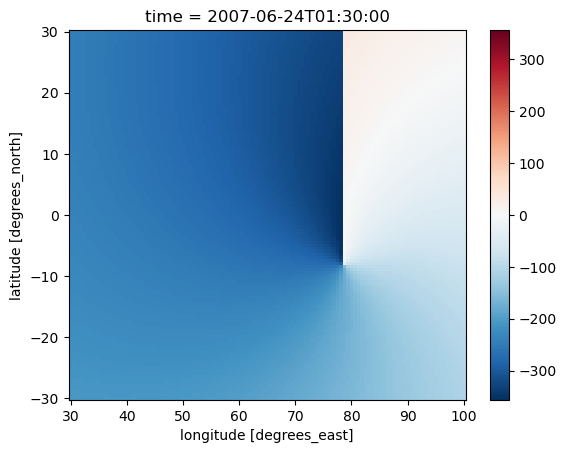

In [85]:
(ds.DIST.isel(time=0)- ds.DIREC.isel(time=0)).plot()

# Fixed angle wedges
# take  n = angular mean (dist from centre - dist from edge)
# E- P (t - t-1)

In [82]:
pressure_levels = ds['lev']
delta_p = pressure_levels.diff('lev')
delta_p = xr.concat([delta_p, delta_p[-1]], dim='lev')  # Align delta_p with data dimensions

# Remove specific variables if they exist in the dataset
variables_to_remove = [
    'vertical_advection', 'integrated_moisture_convergence', 
    'integrated_moisture_vorticity', 'vertical_vorticity', 'horizontal_vorticity'
]
ds = ds.drop_vars([var for var in variables_to_remove if var in ds])

# Horizontal Moisture Flux Divergence (d/dx of UFLXQV + d/dy of VFLXQV)
horizontal_flux_divergence = (-ds['UFLXQV'].differentiate('lon') 
                              - ds['VFLXQV'].differentiate('lat'))


In [27]:
ds = ds.set_coords('lev')

In [83]:
# Vertical Moisture Transport
vertical_flux = ds['OMEGA'] * ds['QV'].differentiate('lev')
# Remove duplicates in the 'lev' coordinate


# Integrate Vertical Moisture Transport over Pressure
integrated_vertical_flux = (vertical_flux * delta_p / g).sum(dim='lev')

# # Add results to dataset for easier analysis and plotting
# ds['horizontal_flux_divergence'] = horizontal_flux_divergence
# ds['integrated_vertical_flux'] = integrated_vertical_flux


ValueError: cannot reindex or align along dimension 'lev' because the (pandas) index has duplicate values

In [62]:

# Horizontal Moisture Flux Divergence
horizontal_flux_divergence = (-ds['UFLXQV'].differentiate('lon') 
                              - ds['VFLXQV'].differentiate('lat'))

# Vertical Moisture Transport
vertical_flux = ds['OMEGA'] * ds['QV']
g=9.8
# Define pressure levels for integration
pressure_levels = ds['pressure']
delta_p = pressure_levels.diff('pressure')
# Align delta_p with data dimensions

# Integrate Vertical Moisture Transport over Pressure
integrated_vertical_flux = (vertical_flux * delta_p / g).sum(dim='lev')

# Add results to dataset for easier analysis and plotting
ds['horizontal_flux_divergence'] = horizontal_flux_divergence
ds['integrated_vertical_flux'] = integrated_vertical_flux


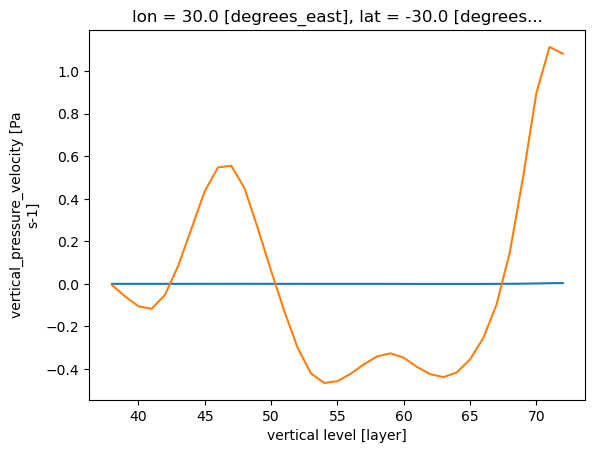

In [67]:
vertical_flux.isel(time =0, lat =0, lon=0).plot()
ds['OMEGA'].isel(time =0, lat =0, lon=0).plot()

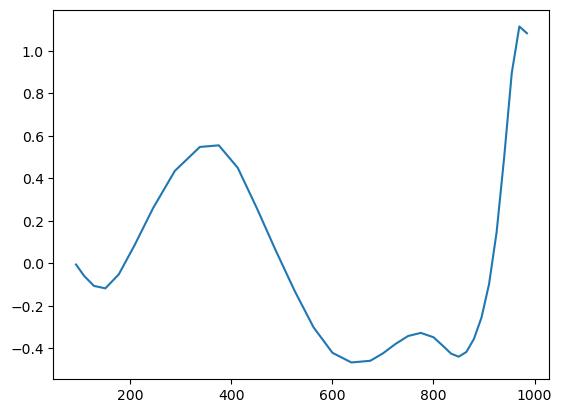

In [77]:
plt.plot(ds.pressure, ds['OMEGA'].isel(time =0, lat =0, lon=0))

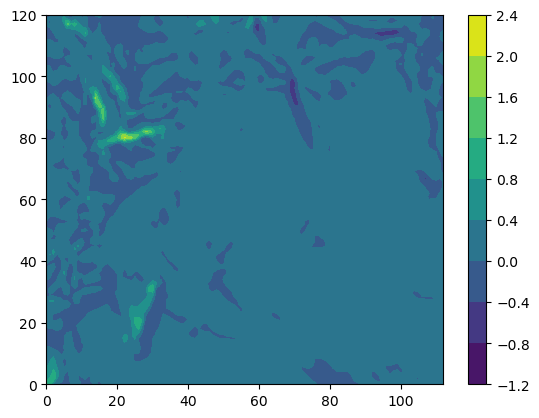

In [84]:
plt.contourf(ds.OMEGA.isel(time=0,lev=-1))
plt.colorbar()

In [76]:
ds.pressure

<xarray.DataArray 'pressure' (lev: 35)> Size: 280B
array([ 92.3657, 108.663 , 127.837 , 150.393 , 176.93  , 208.152 , 244.875 ,
       288.083 , 337.5   , 375.    , 412.5   , 450.    , 487.5   , 525.    ,
       562.5   , 600.    , 637.5   , 675.    , 700.    , 725.    , 750.    ,
       775.    , 800.    , 820.    , 835.    , 850.    , 865.    , 880.    ,
       895.    , 910.    , 925.    , 940.    , 955.    , 970.    , 985.    ])
Coordinates:
  * lev       (lev) float64 280B 38.0 39.0 40.0 41.0 ... 69.0 70.0 71.0 72.0
    pressure  (lev) float64 280B 92.37 108.7 127.8 150.4 ... 955.0 970.0 985.0

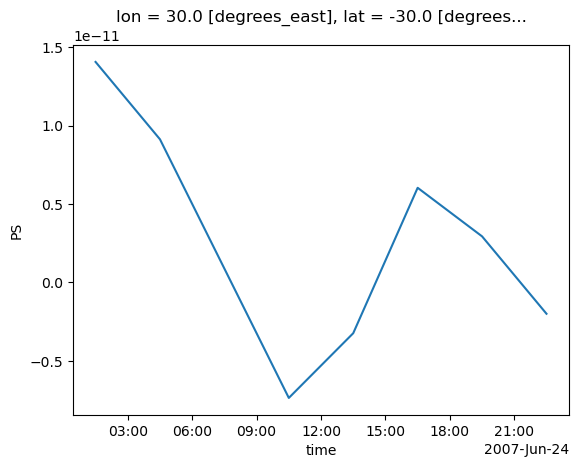

In [75]:
ds.PS.isel( lat =0, lon=0).differentiate('time').plot()


In [72]:
s

NameError: name 's' is not defined

In [51]:
import flox
from flox.xarray import xarray_reduce

In [52]:
ds = ds.set_coords(['DIST', 'DIREC'])
            
      
distance_bins = np.arange(-5.0, 10.0, 0.2)  # Adjust these values as per your data
direction_bins = np.linspace(0, 360, 37)  # For direction, assuming 0-360 degrees

reduced_ds = xarray_reduce(
                ds,
               "DIST",
                "DIREC",
                func = "mean",  
                expected_groups=(
                    pd.IntervalIndex.from_breaks(distance_bins),
                    pd.IntervalIndex.from_breaks(direction_bins),
                ),
                isbin = True,
                fill_value=np.nan
                )

distance_intervals = pd.IntervalIndex.from_breaks(distance_bins)
distance_midpoints = distance_intervals.mid.values

direction_intervals = pd.IntervalIndex.from_breaks(direction_bins)
direction_midpoints = direction_intervals.mid.values

# Replace the 'DIST_bins' and 'DIREC_bins' dimensions with the midpoints
reduced_ds = reduced_ds.assign_coords(DIST_bins=('DIST_bins', distance_midpoints), DIREC_bins=('DIREC_bins', direction_midpoints))

# Optionally, rename the dimensions to reflect that they now represent midpoints
reduced_ds = reduced_ds.rename({'DIST_bins': 'DIST_midpoints', 'DIREC_bins': 'DIREC_midpoints'})

In [53]:
reduced_ds

<xarray.Dataset> Size: 5MB
Dimensions:                     (lev: 35, DIST_midpoints: 74,
                                 DIREC_midpoints: 36)
Coordinates:
  * lev                         (lev) float64 280B 38.0 39.0 40.0 ... 71.0 72.0
    pressure                    (lev) float64 280B 92.37 108.7 ... 970.0 985.0
  * DIST_midpoints              (DIST_midpoints) float64 592B -4.9 -4.7 ... 9.7
  * DIREC_midpoints             (DIREC_midpoints) float64 288B 5.0 ... 355.0
Data variables: (12/61)
    CLOUD                       (lev, DIST_midpoints, DIREC_midpoints) float32 373kB ...
    DELP                        (lev, DIST_midpoints, DIREC_midpoints) float32 373kB ...
    DTDTLWR                     (lev, DIST_midpoints, DIREC_midpoints) float32 373kB ...
    DTDTLWRCLR                  (lev, DIST_midpoints, DIREC_midpoints) float32 373kB ...
    DTDTSWR                     (lev, DIST_midpoints, DIREC_midpoints) float32 373kB ...
    DTDTSWRCLR                  (lev, DIST_midpoints, DIREC_midpoints) float32 373kB ...
    ...                          ...
    TQL                         (DIST_midpoints, DIREC_midpoints) float32 11kB ...
    DISPH                       (DIST_midpoints, DIREC_midpoints) float32 11kB ...
    TROPT                       (DIST_midpoints, DIREC_midpoints) float32 11kB ...
    TROPPB                      (DIST_midpoints, DIREC_midpoints) float32 11kB ...
    horizontal_flux_divergence  (DIST_midpoints, DIREC_midpoints) float32 11kB ...
    integrated_vertical_flux    (DIST_midpoints, DIREC_midpoints) float64 21kB ...
Attributes: (12/30)
    History:                           Original file generated: Thu Dec 25 19...
    Comment:                           GMAO filename: d5124_m2_jan00.tavg3_3d...
    Filename:                          MERRA2_300.tavg3_3d_rad_Nv.20070624.nc4
    Conventions:                       CF-1
    Institution:                       NASA Global Modeling and Assimilation ...
    References:                        http://gmao.gsfc.nasa.gov
    ...                                ...
    Contact:                           http://gmao.gsfc.nasa.gov
    identifier_product_doi:            10.5067/7GFQKO1T43RW
    RangeBeginningDate:                2007-06-24
    RangeBeginningTime:                00:00:00.000000
    RangeEndingDate:                   2007-06-24
    RangeEndingTime:                   23:59:59.000000

In [39]:
delta_p

<xarray.DataArray 'lev' (lev: 35)> Size: 280B
array([1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1.])
Coordinates:
  * lev       (lev) float64 280B 39.0 40.0 41.0 42.0 ... 70.0 71.0 72.0 72.0
    pressure  (lev) float64 280B 108.7 127.8 150.4 176.9 ... 970.0 985.0 985.0

In [37]:
vertical_flux

<xarray.DataArray (time: 7, lev: 35, lat: 121, lon: 113)> Size: 13MB
array([[[[-2.71733858e-09,  3.32572303e-09,  2.01813388e-09, ...,
           1.13721814e-08,  1.26760131e-08,  1.09993774e-08],
         [-1.53469149e-08,  1.48337831e-09, -3.57979590e-10, ...,
           1.66342158e-08,  2.48225405e-08,  2.75179062e-08],
         [-2.47846685e-08, -4.37772973e-09, -2.85586466e-09, ...,
           1.53778359e-08,  2.67545381e-08,  3.69000865e-08],
         ...,
         [ 3.01526448e-09,  6.08213524e-09,  1.04734603e-08, ...,
           1.46043200e-09,  5.67278668e-09,  3.23507776e-10],
         [ 4.70555639e-09,  6.42229114e-09,  9.58282076e-09, ...,
           3.33025851e-09,  8.97159413e-09,  8.94206575e-09],
         [ 6.04061201e-09,  6.22452978e-09,  7.57643814e-09, ...,
          -1.77582837e-09,  6.08623196e-09,  8.12858936e-09]],

        [[-3.66529171e-08,  3.00632541e-09,  1.87495708e-08, ...,
           5.59528175e-08,  7.25363520e-08,  7.76385818e-08],
         [-5.69672736e-08, -1.28259279e-08,  6.35249719e-09, ...,
           3.83539458e-08,  6.55233308e-08,  8.72551738e-08],
         [-6.09412467e-08, -2.65694400e-08, -1.14183187e-08, ...,
           8.87271234e-09,  2.24698411e-08,  4.44312001e-08],
...
           6.95516383e-06,  7.72205567e-06,  1.68853148e-05],
         [ 5.77837591e-06, -4.94676260e-06,  1.00332843e-04, ...,
           1.23963164e-05,  8.10730307e-06,  1.07436463e-05],
         [-5.54320068e-05, -9.91295310e-05, -7.55345973e-05, ...,
           3.29214140e-06,  1.09384678e-06,  7.36061884e-06]],

        [[ 6.02050859e-04,  7.09639688e-04,  3.04498913e-04, ...,
          -2.85255578e-06, -2.32758998e-06, -3.43608576e-07],
         [ 2.32534658e-04,  6.02082117e-04,  1.09018839e-03, ...,
          -2.08059078e-06, -1.43922853e-06,  1.59701221e-06],
         [ 1.77117981e-04,  2.64790433e-04,  6.82288897e-04, ...,
          -1.01093133e-06,  5.31176852e-07,  3.32154013e-06],
         ...,
         [-1.97235204e-06,  4.10116945e-06,  4.05600758e-06, ...,
           4.65341463e-06,  3.84516670e-06,  1.13481237e-05],
         [-5.13457126e-05,  2.93291464e-06,  4.97949768e-05, ...,
           1.39957901e-05,  8.14791565e-06,  7.47229888e-06],
         [-2.53136677e-04, -1.40014163e-04, -6.80613521e-05, ...,
           1.14332249e-06,  6.30968361e-06,  5.54037342e-06]]]],
      dtype=float32)
Coordinates:
  * lon       (lon) float64 904B 30.0 30.62 31.25 31.88 ... 98.75 99.38 100.0
  * lat       (lat) float64 968B -30.0 -29.5 -29.0 -28.5 ... 28.5 29.0 29.5 30.0
  * lev       (lev) float64 280B 38.0 39.0 40.0 41.0 ... 69.0 70.0 71.0 72.0
  * time      (time) datetime64[ns] 56B 2007-06-24T01:30:00 ... 2007-06-24T22...
    pressure  (lev) float64 280B 92.37 108.7 127.8 150.4 ... 955.0 970.0 985.0

In [38]:
delta_p

<xarray.DataArray 'lev' (lev: 35)> Size: 280B
array([1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1.])
Coordinates:
  * lev       (lev) float64 280B 39.0 40.0 41.0 42.0 ... 70.0 71.0 72.0 72.0
    pressure  (lev) float64 280B 108.7 127.8 150.4 176.9 ... 970.0 985.0 985.0

In [21]:
ds_test

<xarray.Dataset> Size: 248MB
Dimensions:                          (time: 7, lev: 35, lat: 121, lon: 113)
Coordinates:
  * lon                              (lon) float64 904B 30.0 30.62 ... 100.0
  * lat                              (lat) float64 968B -30.0 -29.5 ... 30.0
  * lev                              (lev) float64 280B 38.0 39.0 ... 71.0 72.0
  * time                             (time) datetime64[ns] 56B 2007-06-24T01:...
    pressure                         (lev) float64 280B ...
Data variables: (12/66)
    CLOUD                            (time, lev, lat, lon) float32 13MB ...
    DELP                             (time, lev, lat, lon) float32 13MB ...
    DTDTLWR                          (time, lev, lat, lon) float32 13MB ...
    DTDTLWRCLR                       (time, lev, lat, lon) float32 13MB ...
    DTDTSWR                          (time, lev, lat, lon) float32 13MB ...
    DTDTSWRCLR                       (time, lev, lat, lon) float32 13MB ...
    ...                               ...
    integrated_moisture_convergence  (time, lat, lon) float64 766kB ...
    integrated_moisture_vorticity    (time, lat, lon) float64 766kB ...
    vertical_vorticity               (time, lev, lat, lon) float64 27MB ...
    horizontal_vorticity             (time, lev, lat, lon) float32 13MB ...
    DIST                             (time, lat, lon) float64 766kB ...
    DIREC                            (time, lat, lon) float64 766kB ...
Attributes: (12/30)
    History:                           Original file generated: Thu Dec 25 19...
    Comment:                           GMAO filename: d5124_m2_jan00.tavg3_3d...
    Filename:                          MERRA2_300.tavg3_3d_rad_Nv.20070624.nc4
    Conventions:                       CF-1
    Institution:                       NASA Global Modeling and Assimilation ...
    References:                        http://gmao.gsfc.nasa.gov
    ...                                ...
    Contact:                           http://gmao.gsfc.nasa.gov
    identifier_product_doi:            10.5067/7GFQKO1T43RW
    RangeBeginningDate:                2007-06-24
    RangeBeginningTime:                00:00:00.000000
    RangeEndingDate:                   2007-06-24
    RangeEndingTime:                   23:59:59.000000

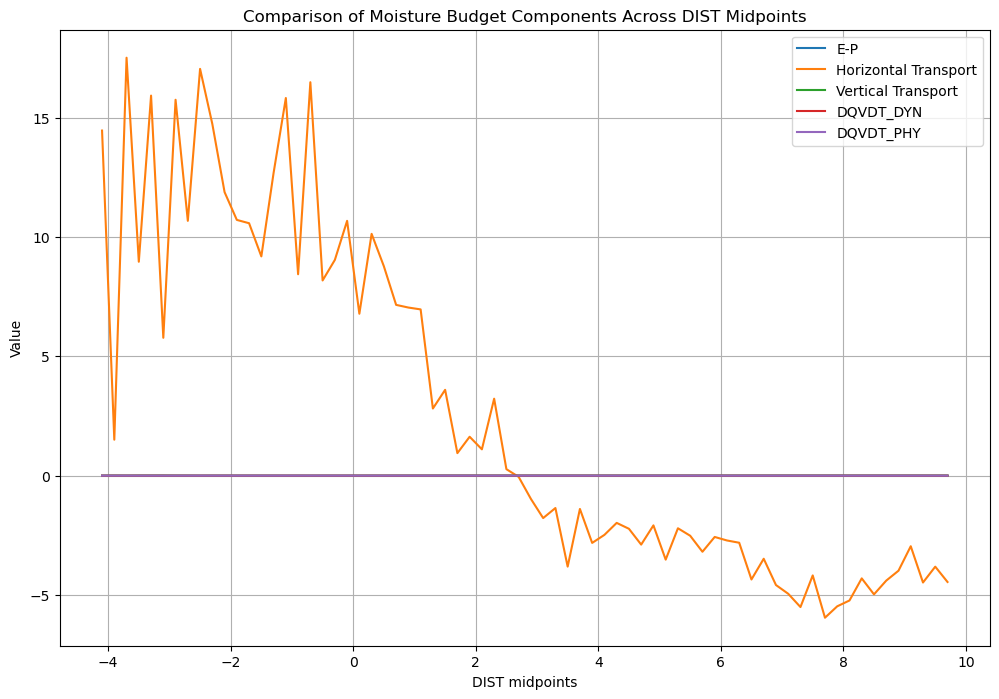

In [61]:
ds_avg = reduced_ds.mean(dim='DIREC_midpoints')

# Define the variables to plot
variables = {
    "E-P": ds_avg["EVAP"] - ds_avg["PRECTOT"],
    "Horizontal Transport": ds_avg["horizontal_flux_divergence"],
    "Vertical Transport": ds_avg["integrated_vertical_flux"],
    "DQVDT_DYN": ds_avg["DQVDT_DYN"],
    "DQVDT_PHY": ds_avg["DQVDT_PHY"]
}

# Create the plot
plt.figure(figsize=(12, 8))

for label, data in variables.items():
    plt.plot(ds_avg["DIST_midpoints"], data, label=label)

# Add labels and title
plt.xlabel("DIST midpoints")
plt.ylabel("Value")
plt.title("Comparison of Moisture Budget Components Across DIST Midpoints")
plt.legend()
plt.grid(True)

# Display the plot
plt.show()

- Scalar n(t - t-1)
- flux form